In [1]:
import sys
#sys.path.insert(0, '../python_scripts')
import json
import glob
import random
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tq
import matplotlib.patches as patches
import numpy as np
from PIL import Image
import utils
import importlib
import threading
import meta
import heatmap
metadata = utils.load("./variables/metadata.p")
from keras.optimizers import *
from keras.models import Sequential
from keras.layers import *
from keras.applications.imagenet_utils import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import array_to_img
from keras import callbacks
from keras.preprocessing.image import Iterator
import os
from keras.applications.imagenet_utils import preprocess_input
from keras.models import Model
from keras.applications.vgg16 import VGG16
from keras.applications.resnet50 import ResNet50
import heatmap
remote = callbacks.RemoteMonitor(root='http://localhost:9000')
from shutil import copyfile
from keras.models import load_model
from keras.models import model_from_json
from keras.layers.advanced_activations import LeakyReLU
import time
import h_gen,meta
from meta import *
from h_gen import *
from utils import *
import gc 

Using Theano backend.
Using gpu device 0: GeForce GTX 960M (CNMeM is enabled with initial size: 80.0% of memory, cuDNN 5105)


In [2]:
image_size = [(768, 1216),(1344,2240)]
FOLDER_TRAIN = "./temp_training/resnet/"

In [6]:
SPLIT = 0.8 # For the train/test split
metadata = meta.create_metadata()

In [4]:
for img_size in image_size:
    dim = str(img_size[0])+'_'+str(img_size[1])+'/'
    mk(FOLDER_TRAIN+''+dim)

##### Let's do some precomputing:

In [ ]:
for img_size in image_size[1:]:
    print(img_size)
    dim = str(img_size[0])+'_'+str(img_size[1])+'/'
    model1 = ResNet50(include_top=False, input_shape=(3,) + img_size)
    model2 = Model(model1.input, model1.layers[-2].output)

    img_a = Input(shape=(3,) + img_size)
    x = model2(img_a)
    x = AveragePooling2D(pool_size=(7, 7), strides=(1,1), border_mode="valid")(x)
    model = Model(img_a, x)
    X = np.zeros((1, 3)+img_size)
    f = os.listdir(FOLDER_TRAIN + dim)
    del model1,model2
    gc.collect()
    output_size = heatmap.get_dim(model, -1, input_shape=(3,)+img_size)
    utils.save(output_size, FOLDER_TRAIN + dim +"mask_size")
    for key, v in tq(metadata.items()):
        if v["filename"]+ ".npy" not in f:
        # First of all, if there is no rectangle and the image is not in NoF, 
        # then there is a problem.

            if v["class"] != "NoF" and "rectangles" not in v:
                continue

            X[0] = img_to_array(load_img(v["path"],target_size=img_size))
            X = preprocess_input(X)
            y = model.predict(X)[0]
            utils.save_array(y, FOLDER_TRAIN +dim+ v["filename"])
    #output_size = heatmap.get_dim(model, -1, input_shape=(3,)+img_size)
    #utils.save(output_size, FOLDER_TRAIN + dim +"mask_size")

    

## First step, create train and test set.

In [5]:
import operator
output_size = []
nb_filters = []
mask_size = []
def find_bigger(mask):
    obj = []
    for i,m in enumerate(mask):
        obj.append([i,m[0]*m[1]])
    return sorted(obj,key=operator.itemgetter(1),reverse=True)[0][0]
    
for i,img_size in enumerate(image_size):
    dim = str(img_size[0])+'_'+str(img_size[1])+'/'
    output_size.append(utils.load(FOLDER_TRAIN +dim+ "mask_size"))
    nb_filters.append(output_size[0][0])
    mask_size.append(output_size[i][1:])
    print("size of our filters: " + str(nb_filters[i]))
    print("size of our mask: " + str(mask_size[i]))
nb_filters = nb_filters[0]
print(mask_size)
print(nb_filters)

size of our filters: 2048
size of our mask: (18, 32)
size of our filters: 2048
size of our mask: (36, 64)
[(18, 32), (36, 64)]
2048


In [7]:
##THAT PART IS ONLY FOR ME . AS I HAVE ONLY 127 IMAGES IN (1152, 2048)
def filter_sample_to_same(list_files):
    import collections
    collection = collections.defaultdict(list)
    for list_file in list_files:
        for f in list_file:
            collection[f.split('/')[-1].split('.')[0]].append(f)
    return collection
def filter_collection(collection):
    obj = []
    for key in collection.keys():
        if len(collection[key]) >1:
            obj.append(collection[key])
    return obj
        
def get_same_sample():
    list_files = []
    for img_size in image_size:    
        dim = str(img_size[0])+'_'+str(img_size[1])+'/'
        list_files.append(h_gen.get_all_images(regex=FOLDER_TRAIN +dim+ "*.npy"))
    return list_files
collection = filter_collection(filter_sample_to_same(get_same_sample()))
print(len(collection))

0


In [8]:
list_files = []
list_files = [x[0].split('/')[-1].split('.')[0]+'.jpg'  for x in collection]
random.shuffle(list_files)
l = int(0.8 * len(list_files))

training_set = list_files[:l]
test_set = list_files[l:]
print("First element for debug: " + training_set[0])

IndexError: list index out of range

## Second step, create the data generator.

In [8]:
class DiskArrayIterator(Iterator):
    
    def __init__(self, batch_size, nb_filters, mask_size, folder, file_list, 
                 metadata,image_size, with_name = False, shuffle=False, seed=None):
        self.batch_size=batch_size
        self.nb_filters=nb_filters
        self.mask_size=mask_size
        self.folder=folder
        self.file_list=file_list
        self.metadata = metadata
        self.with_name = with_name
        self.image_size = image_size
        super(DiskArrayIterator, self).__init__(len(file_list), batch_size, shuffle, seed)
    
    def find_bigger(mask):
        obj = []
        for i,m in enumerate(mask):
            obj.append([i,m[0]*m[1]])
        return sorted(obj,key=operator.itemgetter(1),reverse=True)[0][0]

    def next(self):
        with self.lock:
            index_array, current_index, current_batch_size = next(self.index_generator)
        
        mask_larger = self.mask_size[find_bigger(self.mask_size)]
        reshaped = mask_larger[0]*mask_larger[1]
        X = [np.zeros((self.batch_size, self.nb_filters) + m) for m in self.mask_size]
        Y = [np.zeros((self.batch_size, reshaped,1)) for _ in range(5)]
        W = [np.zeros((self.batch_size, reshaped))   for _ in range(5)]
        selected_files = [self.file_list[i] for i in index_array]
        meta = [metadata[x] for x in selected_files]
        # We loop over the files
        for c, v in enumerate(meta):
            
            masks, m_weights = h_gen.get_5_masks_w(v, mask_larger)
            
            # loop over the 5 masks
            for i, mask in enumerate(masks):
                
                mask0 = np.expand_dims(mask, axis=0)
                mask0 = np.reshape(mask0,(reshaped,))
                y = np.expand_dims(mask0, axis=1)
                for j,image_size in enumerate(self.image_size):
                    dim = str(image_size[0])+'_'+str(image_size[1])+'/'
                    X[j][c] = utils.load_array(self.folder +dim+v["filename"])
                m_weight = np.expand_dims(m_weights[i], axis=0)
                m_weight = np.reshape(m_weight,(reshaped,))
                Y[i][c] = y
                W[i][c] = m_weight
        
        if self.with_name:
            return X, Y, W, [v["path"] for v in meta]
        return X, Y, W
        #return X, Y

In [9]:
import importlib
importlib.reload(h_gen)

<module 'h_gen' from 'C:\\Users\\yolo\\Desktop\\fish\\h_gen.py'>

In [10]:
for X, Y, W , paths in DiskArrayIterator(16, nb_filters, mask_size, FOLDER_TRAIN, training_set, metadata,image_size, with_name=True, seed=int(np.random.uniform(1,100)),shuffle=True):
    break

In [11]:
print("shape of X:", [x.shape for x in X])
print("lenght of Y:", len(Y))
print("shape of Y[0]:", Y[0].shape)
print("lenght of W:", len(W))
print("shape of W[0]:", W[0].shape)

shape of X: [(16, 2048, 18, 32), (16, 2048, 36, 64)]
lenght of Y: 5
shape of Y[0]: (16, 2304, 1)
lenght of W: 5
shape of W[0]: (16, 2304)


./train/DOL/img_04824.jpg


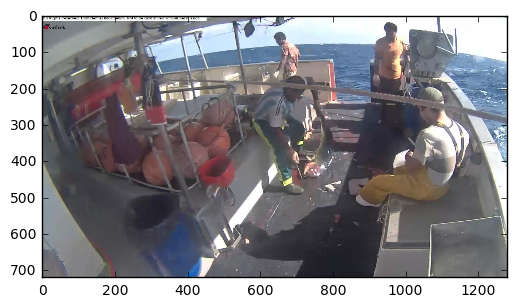

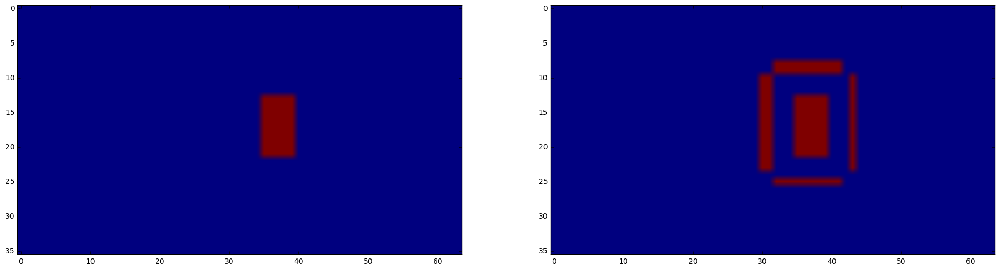

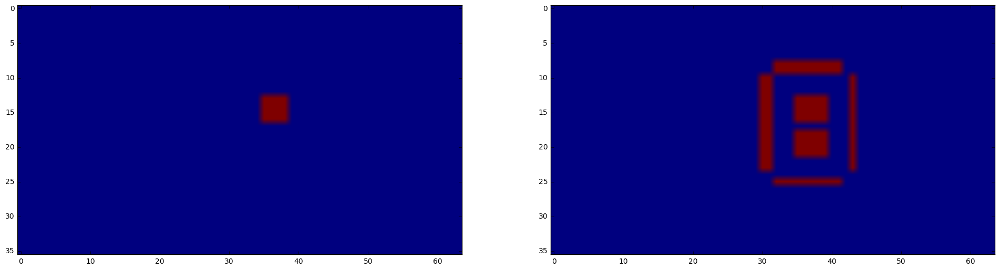

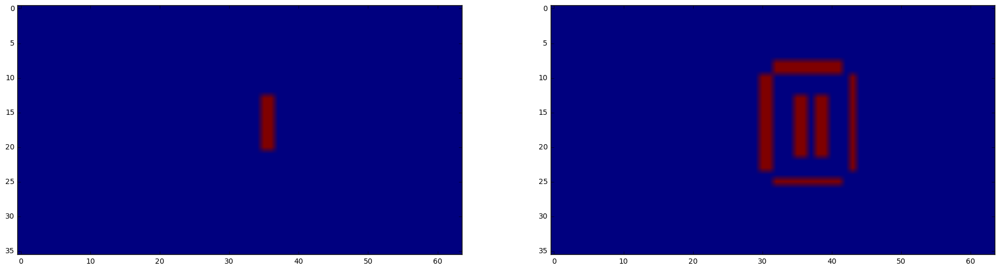

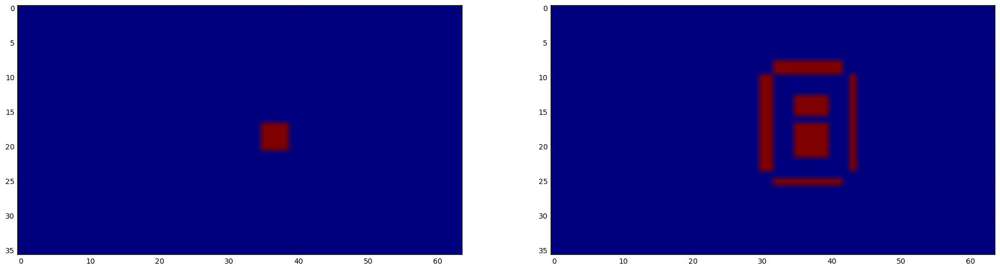

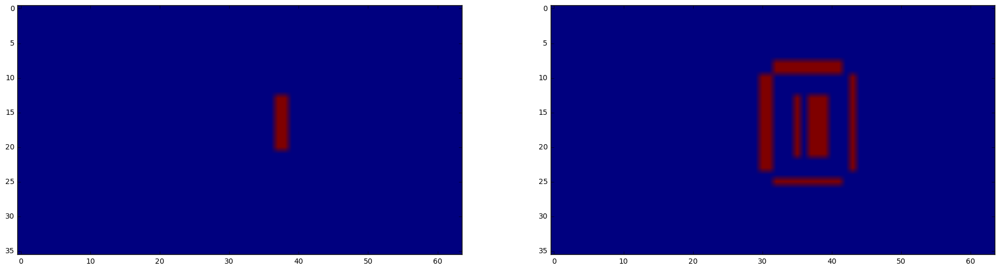

./train/ALB/img_04728.jpg


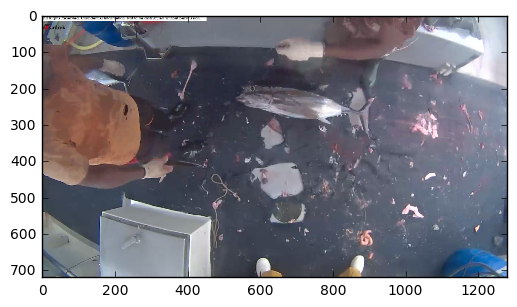

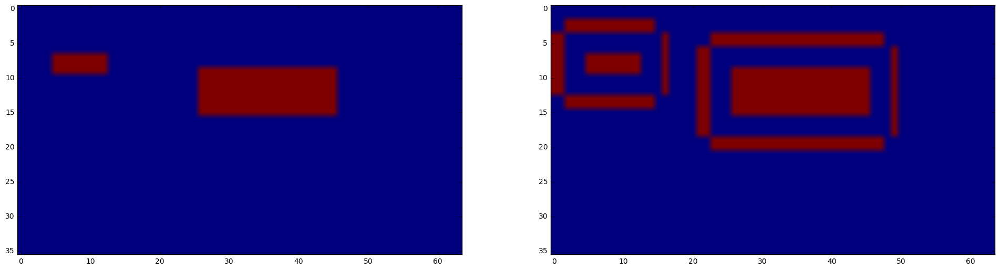

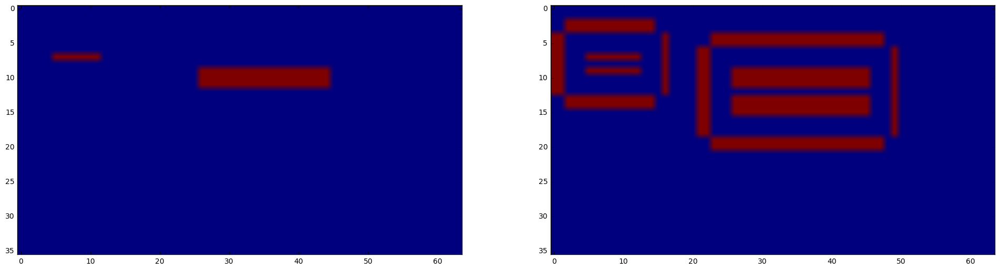

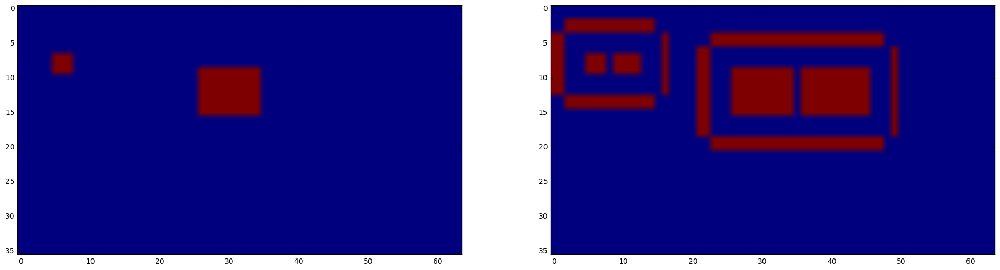

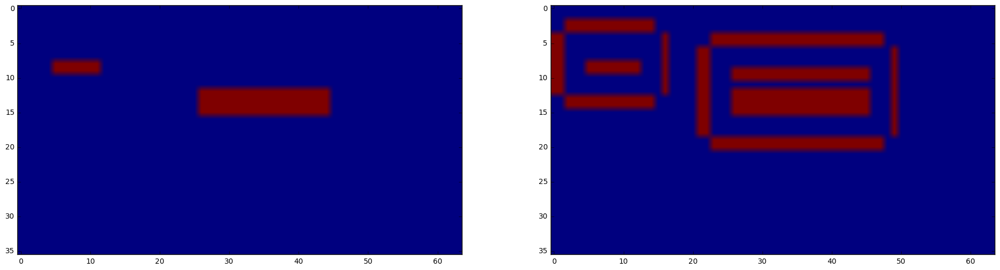

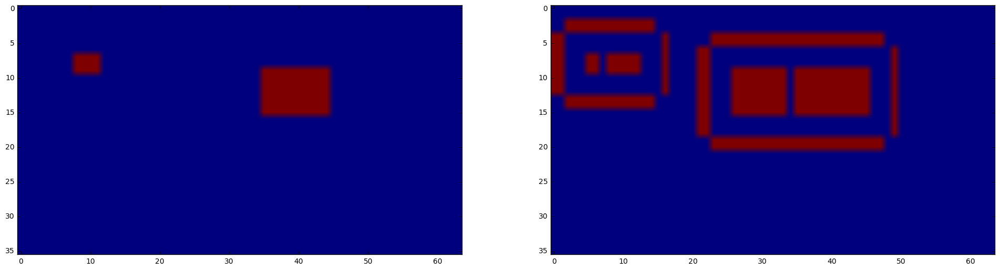

./train/BET/img_05344.jpg


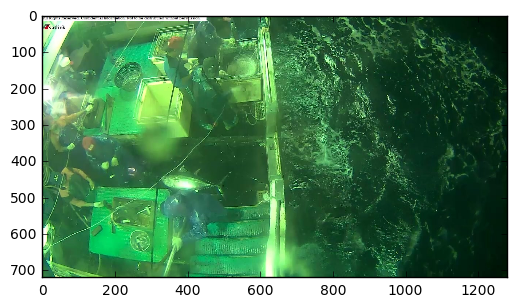

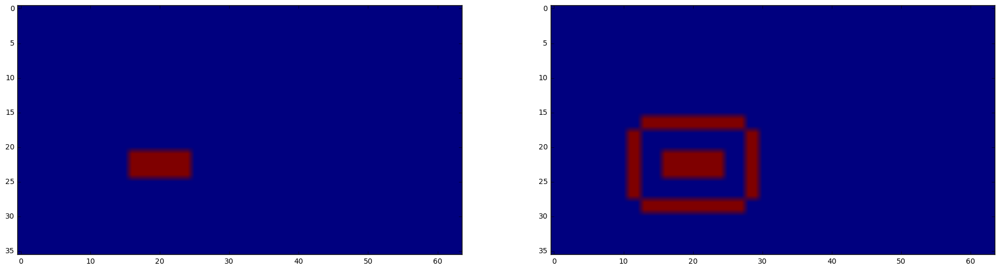

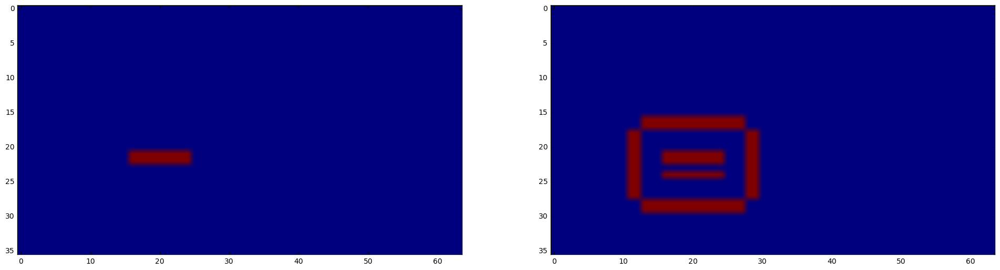

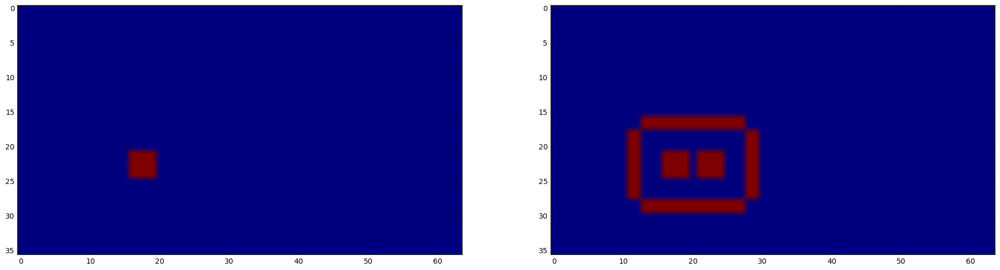

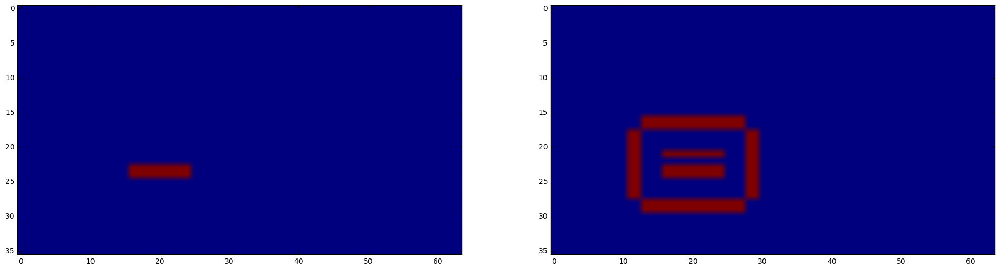

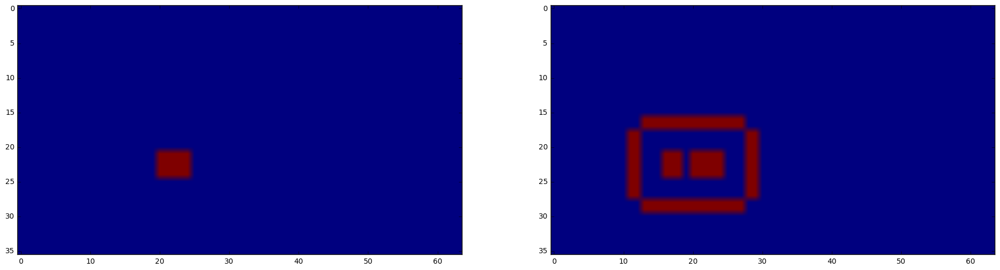

./train/NoF/img_03330.jpg


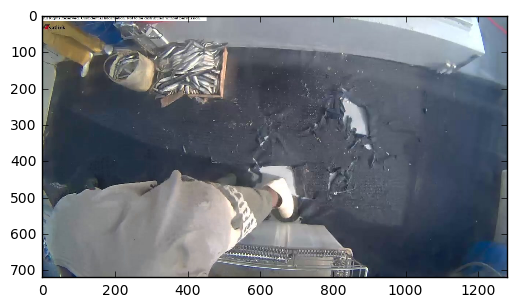

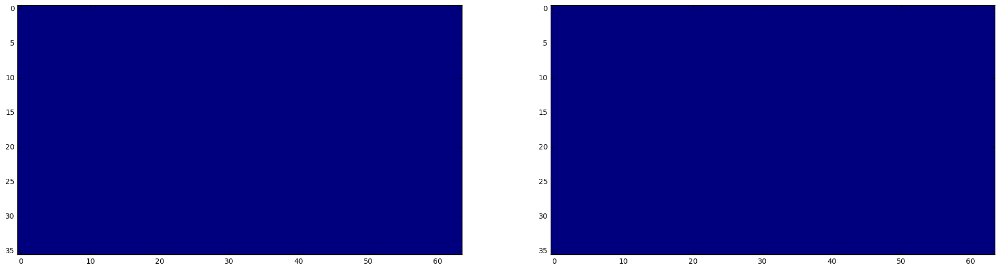

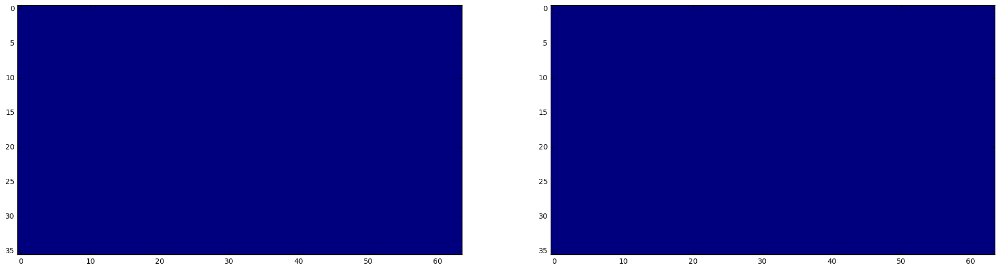

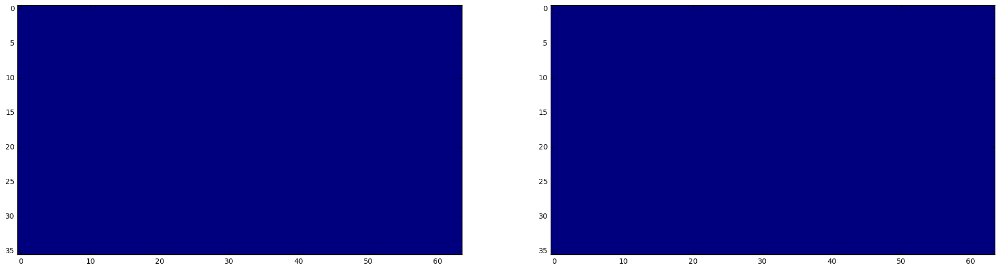

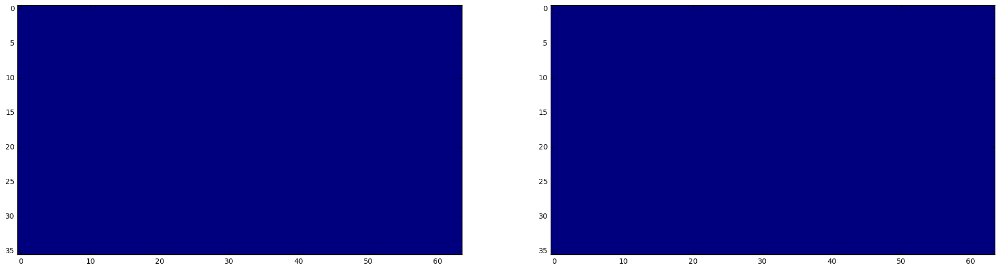

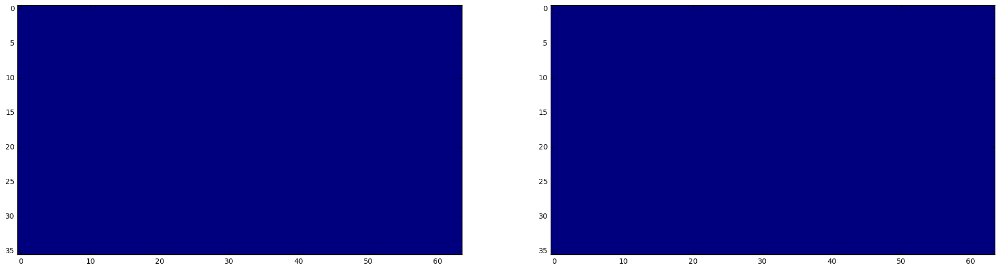

In [12]:
for i in range(4):
    print(paths[i])
    plt.imshow(load_img(paths[i]))
    plt.show()
    for j in range(5):
        plt.figure(figsize=(24,24))
        plt.subplot(1,2,1)
        plt.imshow(np.reshape(Y[j][i],mask_size[1]))
        plt.subplot(1,2,2)
        plt.imshow(np.reshape(W[j][i],mask_size[1]))        
        plt.show()


## Third step, create the network.

##### First, let's create the network that will be shared:

In [9]:
nb_input_filters = 1000
mask_size = [(18, 32), (36, 64)]
nb_filters = 1000
print(mask_size)
print(nb_filters)
# We put this value so that we can reuse the weights of the final layer of the resnet.

[(18, 32), (36, 64)]
1000


In [10]:
def Conv2DReluBatchNorm(n_filter, w_filter, h_filter, inputs):
    return BatchNormalization()(Activation(activation='relu')(Convolution2D(n_filter, w_filter, h_filter, border_mode='same')(inputs)))
def model_custom_1(nb_input_filters):
    img_input = Input(shape=(nb_input_filters,) + (None,None)) 
    x = Convolution2D(512, 1, 1, activation='relu')(img_input)
    #x = BatchNormalization(axis=1)(x)
    x = Convolution2D(256, 1, 1, activation='relu')(x)
    #x = BatchNormalization(axis=1)(x)
    x = Convolution2D(128, 1, 1, activation='relu')(x)
    #x = BatchNormalization(axis=1)(x)
    last_filter = 64
    x = Convolution2D(last_filter, 1, 1, activation='relu')(x)
    return Model(input=img_input,output=x), last_filter

def model_custom_2(nb_input_filters):
    a,b = tuple([Input(shape=(nb_input_filters,) + m) for m in mask_size])

    c = Convolution2D(16, 1, 1, activation='relu')(a)

    c = Convolution2D(16, 1, 1, activation='relu')(c)

    c = UpSampling2D(size=(2, 2), dim_ordering='default')(c)
    
    d = Convolution2D(16, 1, 1, activation='relu')(b)

    d = Convolution2D(16, 1, 1, activation='relu')(d)

    
    e = Merge(mode='concat', concat_axis=1)([c,d])


    e = Convolution2D(16, 1, 1, activation='relu')(e)

    e = Convolution2D(16, 1, 1, activation='relu')(e)
 
    e = Convolution2D(1, 1, 1, activation='linear')(e)


    e = Reshape((1, mask_size[1][0]*mask_size[1][1]))(e)
    e = Permute((2, 1))(e)
    
    return Model(input=[a,b],output=e)

##### Here is the final network:

In [11]:
nb_input_filters = 1000
print(nb_filters,mask_size)
img_inputs = [Input(shape=(nb_filters,) + m) for m in mask_size]
print(img_inputs)

first_con = Convolution2D(nb_input_filters, 1, 1, activation='relu')
x, y = [first_con(inp) for inp in img_inputs]

x = BatchNormalization(axis=1)(x)
y = BatchNormalization(axis=1)(y)

W = []
for _ in range(5):
    model_cus_1, last_filter = model_custom_1(nb_input_filters)
    w = model_cus_1(x)
    z = model_cus_1(y)
    W.append((w,z))
    
Z=[]
for a,b in W:
    model_cus_2 = model_custom_2(last_filter)
    k = model_cus_2([a,b])
    Z.append(k)
    
model = Model(input=img_inputs, output=Z)



1000 [(18, 32), (36, 64)]
[input_1, input_2]


In [12]:
model.output

[InplaceDimShuffle{0,2,1}.0,
 InplaceDimShuffle{0,2,1}.0,
 InplaceDimShuffle{0,2,1}.0,
 InplaceDimShuffle{0,2,1}.0,
 InplaceDimShuffle{0,2,1}.0]

##### Let's insert the imageNet weights:

In [13]:
# We need the last weights of the resnet50:
resnet = ResNet50()

In [14]:
model.layers[2]

In [15]:
resnet.layers[-1]

In [17]:
from importlib import reload
reload(heatmap)

<module 'heatmap' from 'D:\\Projet\\2016\\pythonProject\\Nature_fisheries_conservancy\\notebooks\\fish\\heatmap.py'>

In [20]:
heatmap.insert_weights(resnet.layers[-1], model.layers[2])

1000 1000 1 1
(1000, 1, 1, 1000)


ValueError: total size of new array must be unchanged

In [21]:
model_file = "models/resnet_mask_training.h5"
mk('models/')

In [22]:
# we can now save the model.
model.save(model_file)

## Fourth step, training.

In [23]:
del resnet
gc.collect()

523

In [24]:
model_file = "models/resnet_mask_training.h5"
model = load_model(model_file)

C:\Program Files\Anaconda3\lib\site-packages\keras\models.py:148: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


In [25]:
#model.summary()

In [26]:
model.layers[2].trainable=False

In [27]:
sgd = SGD(lr=0.0001, decay=1e-6, momentum=0.0, nesterov=True)
adam = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
model.compile(loss='mse', optimizer=adam, sample_weight_mode="temporal")

In [19]:
train_gen = DiskArrayIterator(8, nb_filters, mask_size, FOLDER_TRAIN, training_set, metadata,image_size)
test_gen = DiskArrayIterator(8, nb_filters, mask_size, FOLDER_TRAIN, test_set, metadata,image_size)

In [29]:
history = model.fit_generator(train_gen, samples_per_epoch=16, nb_epoch=150, callbacks=[remote], 
                              verbose=0, validation_data=test_gen, nb_val_samples=16, initial_epoch=51)

In [15]:
file = "yoloduswag.h5"

In [38]:
model.save(file)

In [16]:
model = load_model(file)

DEBUG: nvcc STDOUT mod.cu
   Creating library C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmp7nvo1oo6/m9a6bd0eb5ed5c92e91261282fc495cb4.lib and object C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmp7nvo1oo6/m9a6bd0eb5ed5c92e91261282fc495cb4.exp

DEBUG: nvcc STDOUT mod.cu
   Creating library C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmpqx1l_0ch/m848dd898e26d545ff6290e3aa98de3d5.lib and object C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmpqx1l_0ch/m848dd898e26d545ff6290e3aa98de3d5.exp

DEBUG: nvcc STDOUT mod.cu
   Creating library C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_Genui

In [20]:
model.layers[2].trainable=True

In [21]:
sgd = SGD(lr=0.00001, decay=1e-6, momentum=0.0, nesterov=True)
adam = Adam(lr=0.00001, beta_1=0.9, beta_2=0.999, epsilon=1e-08, decay=0.0)
model.compile(loss='mse', optimizer=sgd, sample_weight_mode="temporal")

In [23]:
history = model.fit_generator(train_gen, samples_per_epoch=64, nb_epoch=100, callbacks=[remote], 
                              verbose=0,validation_data=test_gen, nb_val_samples=64)

KeyboardInterrupt: 

In [24]:
file_trained = "models/fish_detection_trained_1.1.h5"

In [25]:
model.save(file_trained)

## Fifth step, display results.

In [33]:
import sys
#sys.path.insert(0, '../python_scripts')
import h_gen
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tq
import matplotlib.patches as patches
import numpy as np
import utils
import importlib
import threading
import meta
import heatmap
import itertools
import heatmap
import time
from numpy import unravel_index
import heatmaps_to_rect as htr
importlib.reload(htr)
importlib.reload(utils)
importlib.reload(meta)
importlib.reload(h_gen)

<module 'h_gen' from 'C:\\Users\\yolo\\Desktop\\fish\\h_gen.py'>

In [34]:
for X, Y, W , paths in DiskArrayIterator(16, nb_filters, mask_size, FOLDER_TRAIN, training_set, metadata,image_size, with_name=True, seed=6):
    break

In [35]:
Z = model.predict(X)

./train/ALB/img_02948.jpg


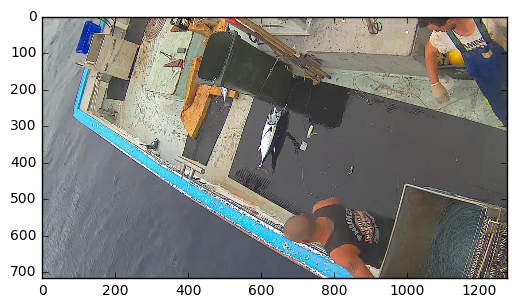

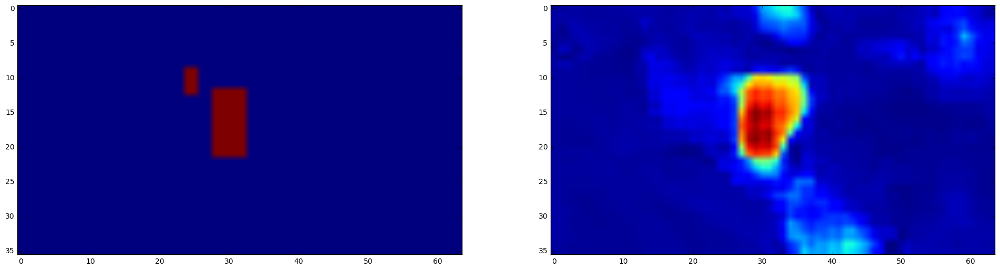

max:  1.02363
min:  -0.0415268


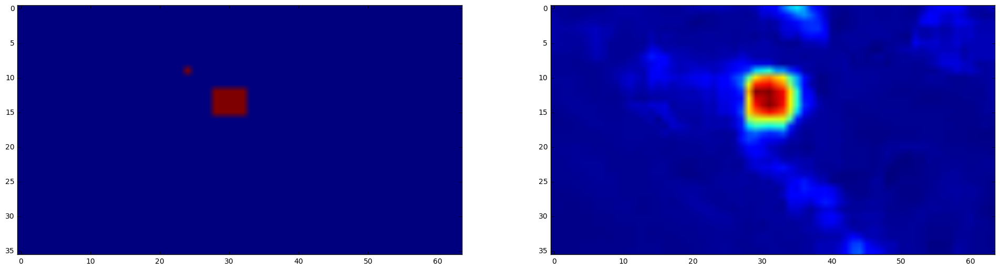

max:  0.953676
min:  -0.0212743


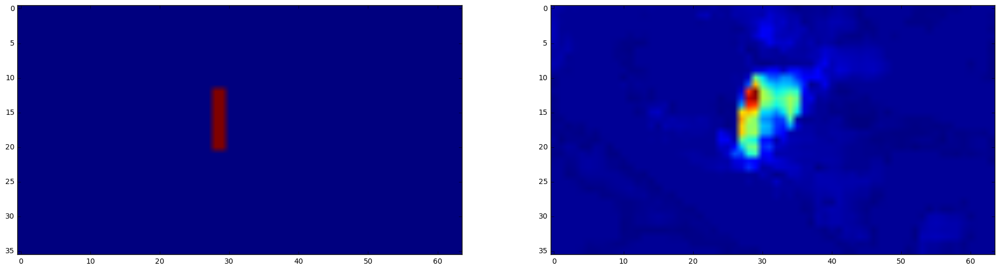

max:  0.390832
min:  -0.0012737


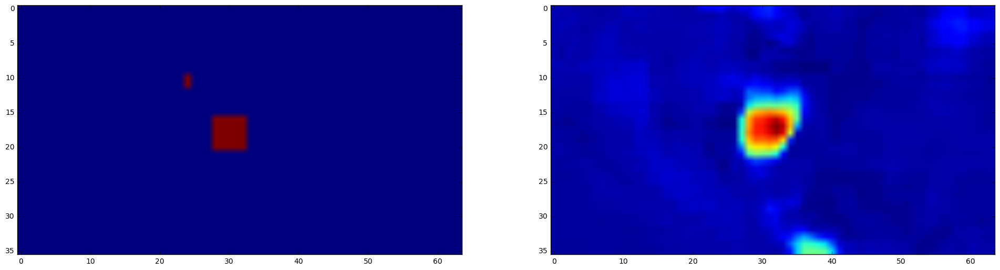

max:  1.11802
min:  -0.0478869


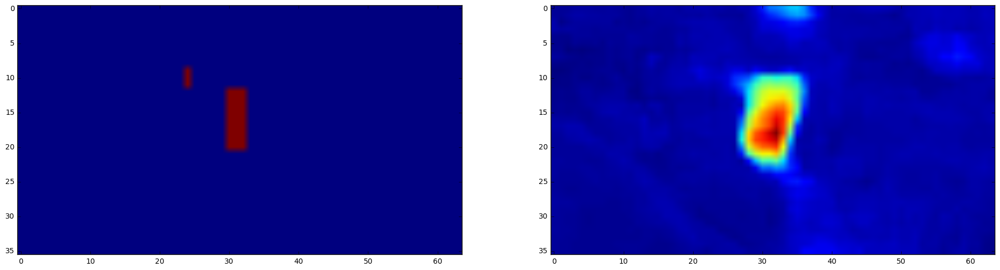

max:  1.02184
min:  -0.0367077
(5, 36, 64)
There are 81 rectangles configurations
The kernel size is 26


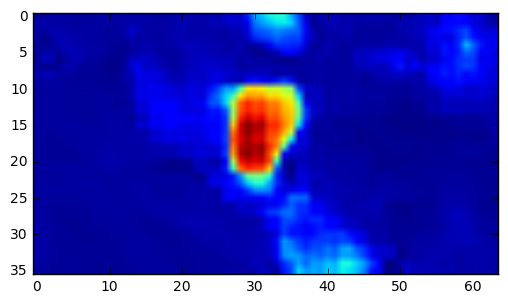

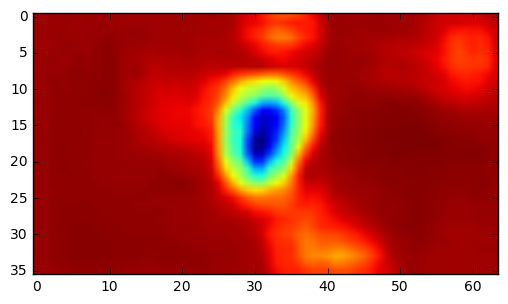

max found at position  (0, 32, 16, 31)
max  199.816
min  -477.132
(10, 27, 13, 10)


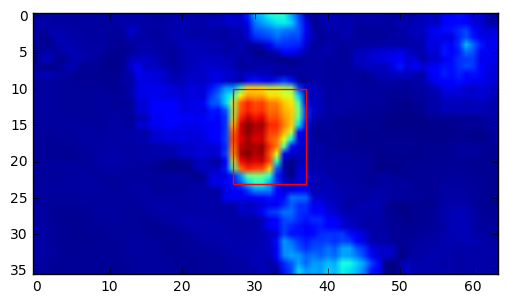

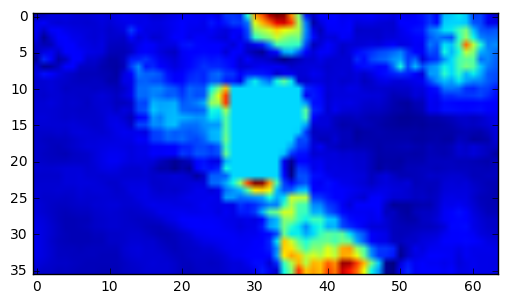

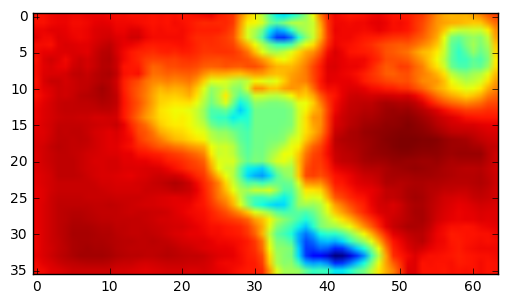

max found at position  (0, 47, 33, 40)
max  37.4506
min  -118.547
(30, 34, 7, 14)


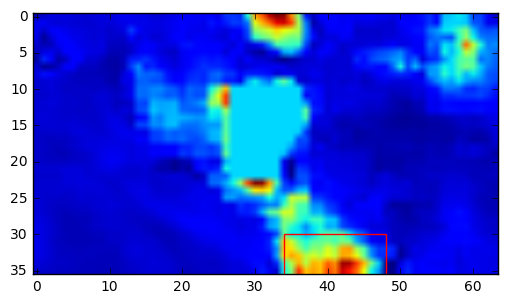

./train/YFT/img_05680.jpg


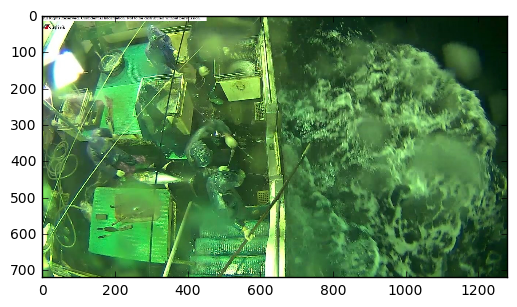

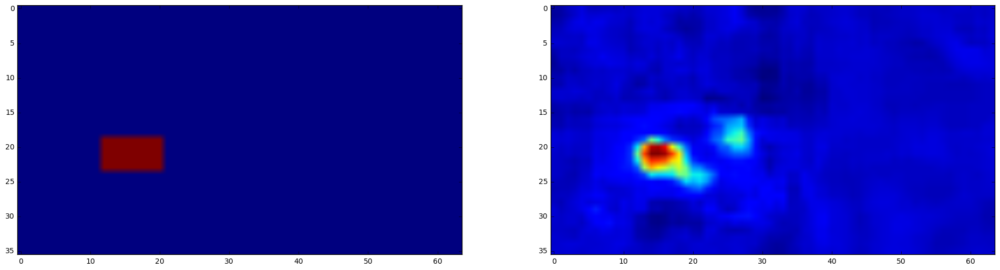

max:  0.892086
min:  -0.0610495


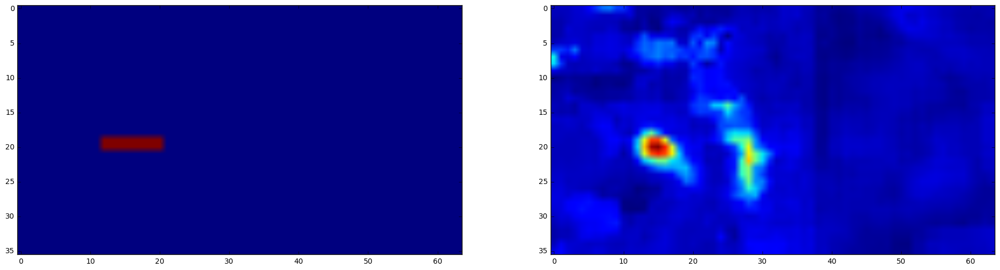

max:  0.4431
min:  -0.0266914


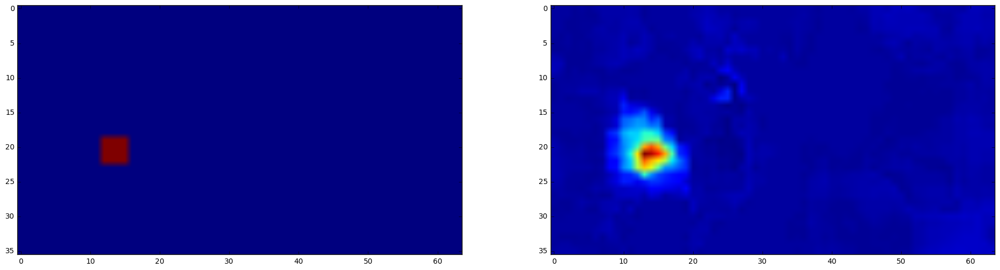

max:  0.476846
min:  -0.00839332


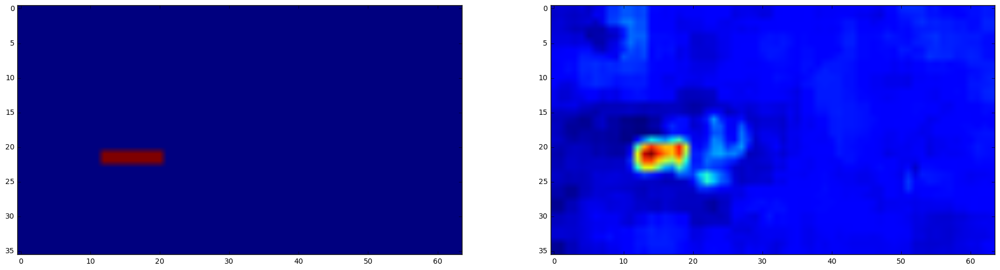

max:  0.480672
min:  -0.0617587


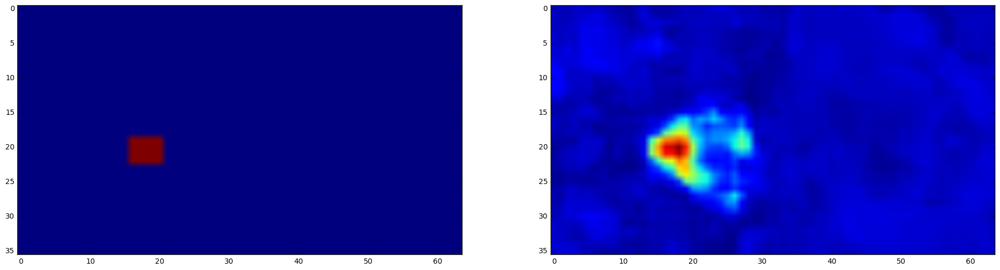

max:  0.541643
min:  -0.0314879
(5, 36, 64)
There are 81 rectangles configurations
The kernel size is 26


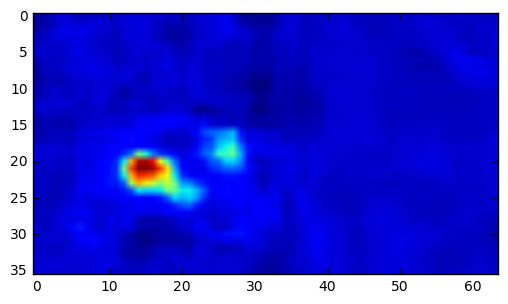

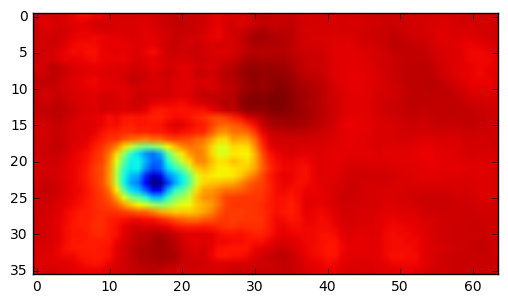

max found at position  (0, 29, 21, 16)
max  90.9476
min  -240.6
(18, 12, 7, 10)


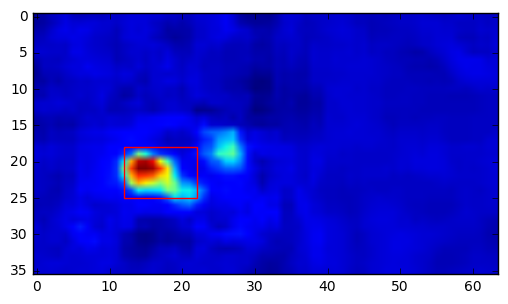

./train/NoF/img_03643.jpg


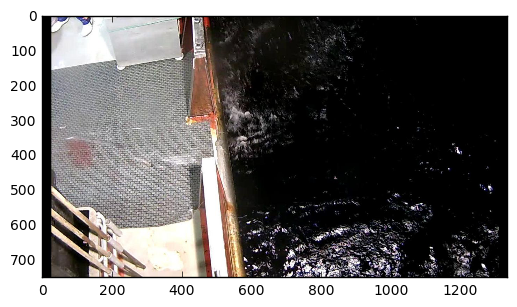

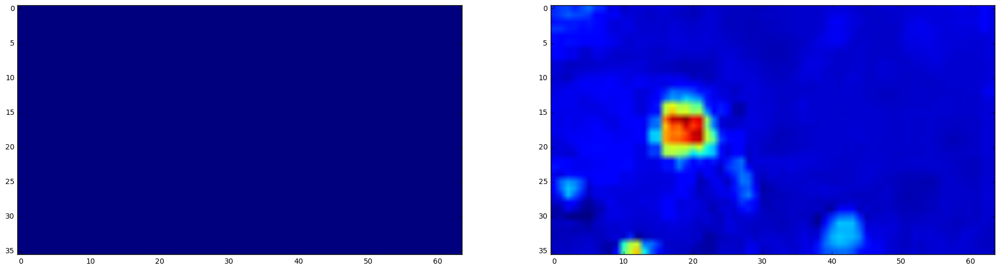

max:  0.569217
min:  -0.0482261


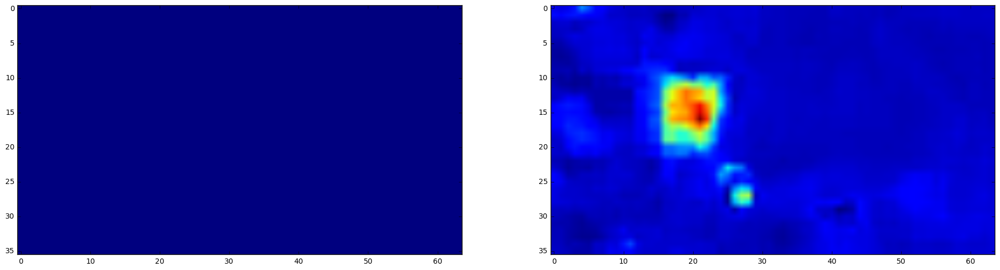

max:  0.392916
min:  -0.0279682


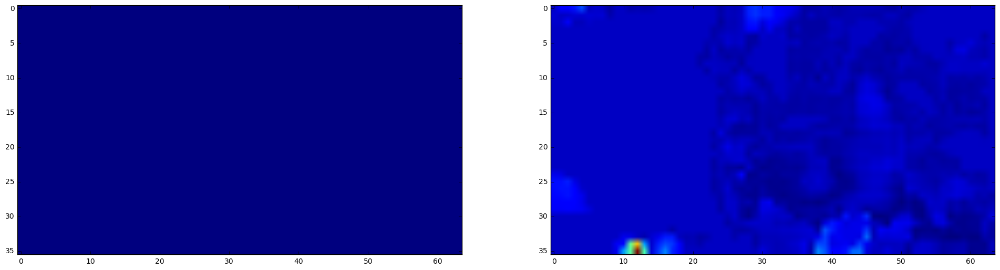

max:  0.172446
min:  -0.0044495


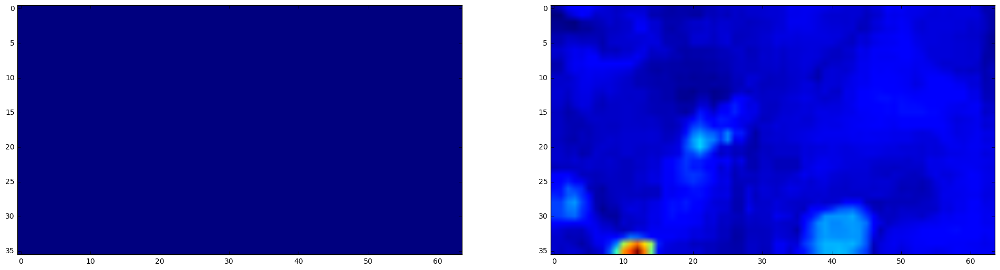

max:  0.540262
min:  -0.0383376


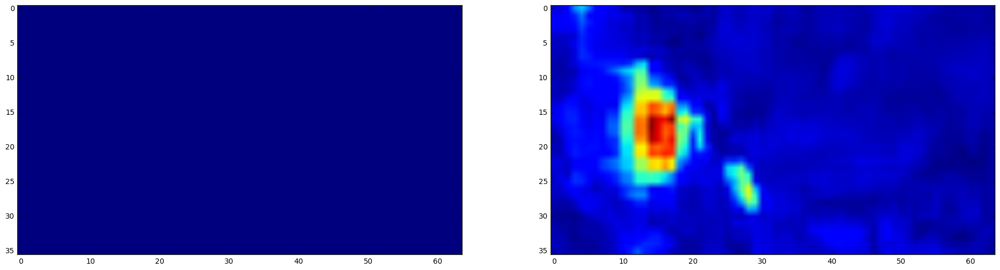

max:  0.488359
min:  -0.0302455
(5, 36, 64)
There are 81 rectangles configurations
The kernel size is 26


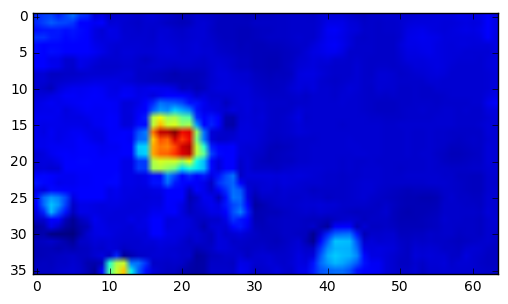

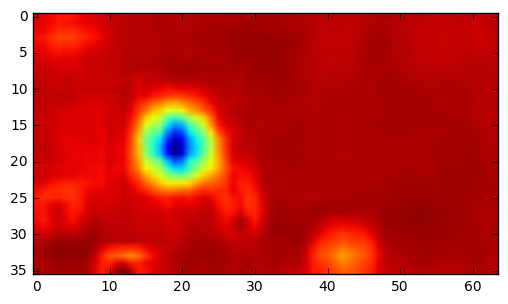

max found at position  (0, 30, 18, 20)
max  39.3142
min  -219.859
(14, 16, 9, 10)


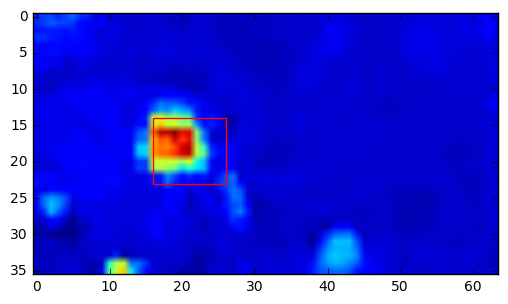

./train/OTHER/img_05425.jpg


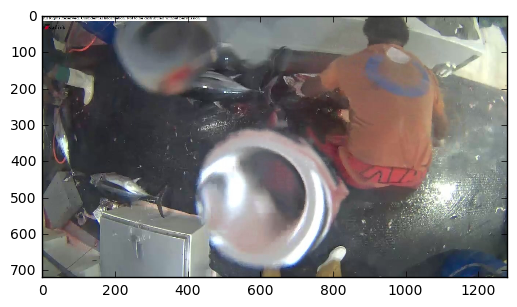

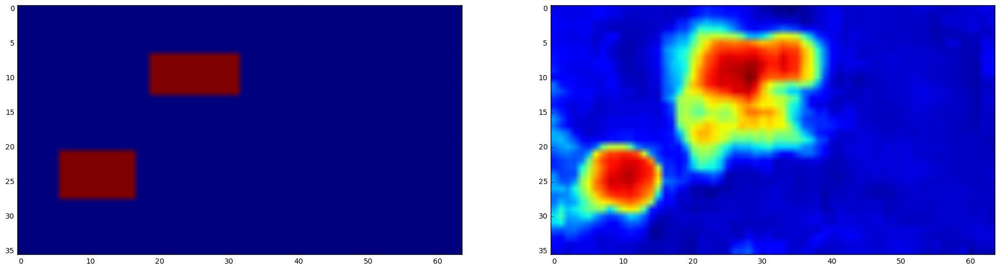

max:  1.09568
min:  -0.0751564


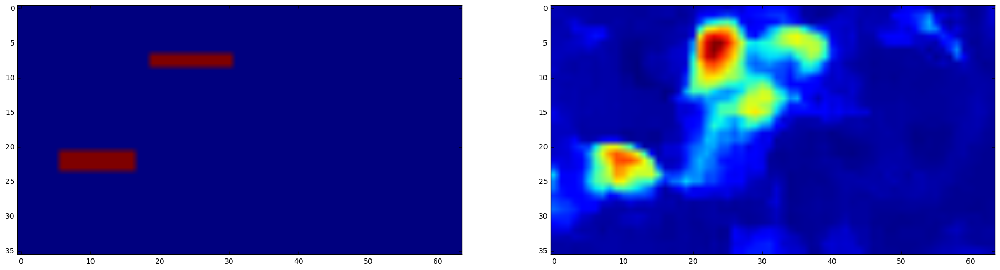

max:  0.996084
min:  -0.0292292


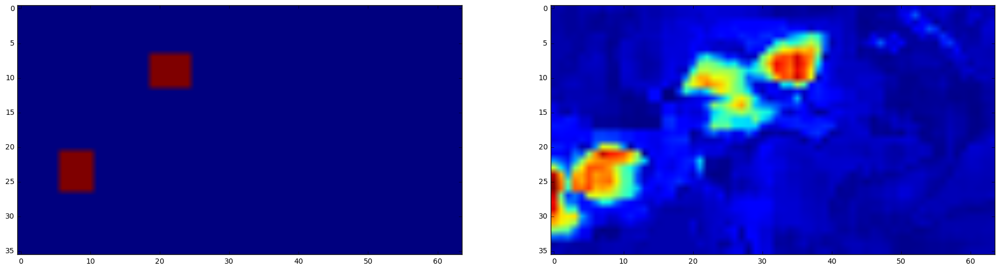

max:  0.383377
min:  -0.0096764


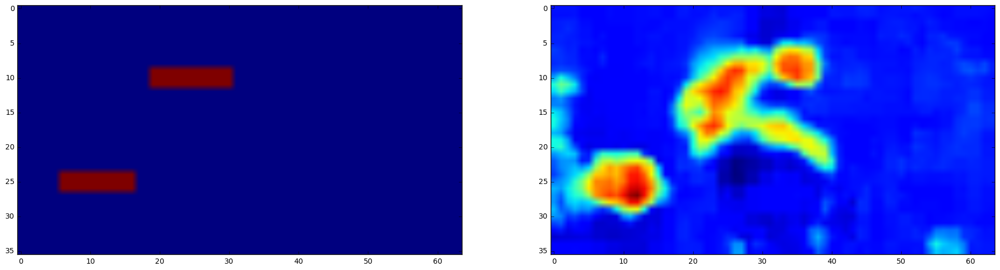

max:  0.724235
min:  -0.117905


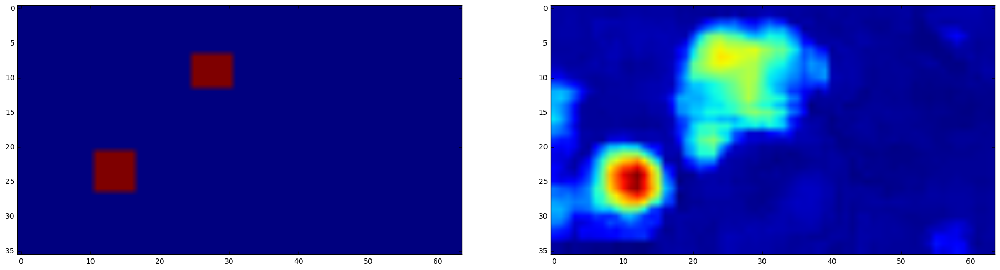

max:  1.3682
min:  -0.0375476
(5, 36, 64)
There are 81 rectangles configurations
The kernel size is 26


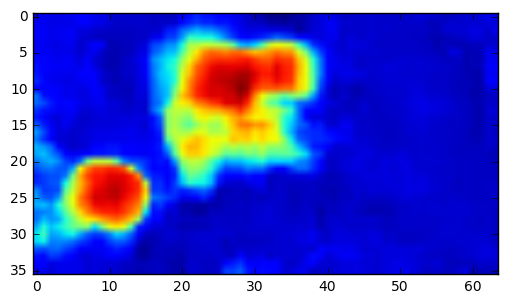

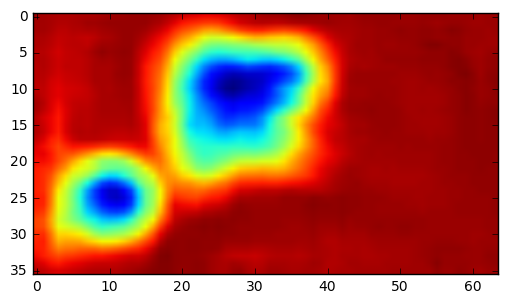

max found at position  (0, 40, 25, 10)
max  185.163
min  -541.225
(20, 5, 11, 12)


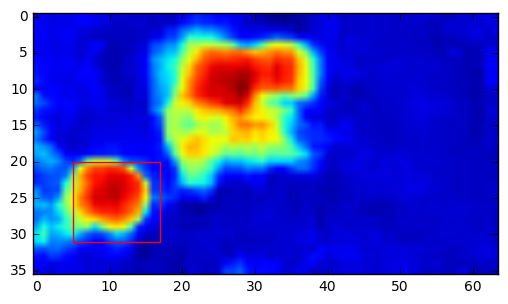

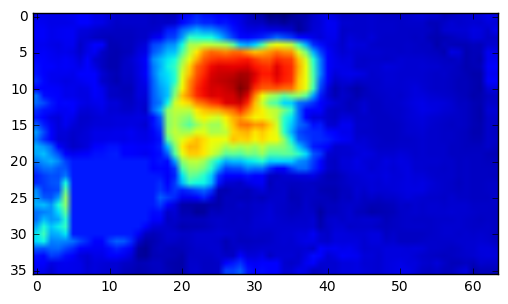

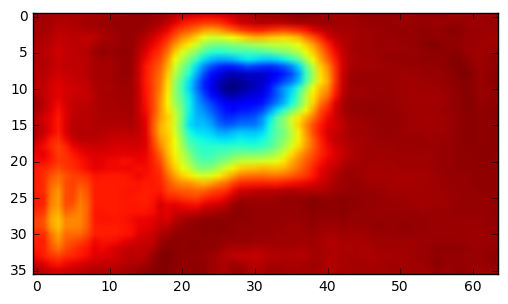

max found at position  (0, 49, 9, 23)
max  124.158
min  -541.225
(4, 17, 11, 14)


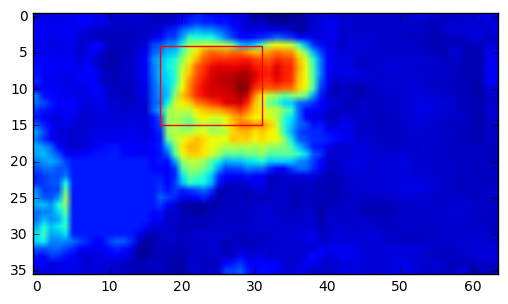

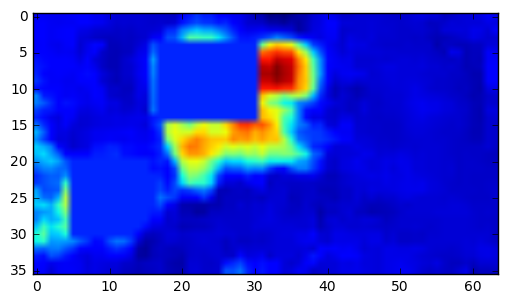

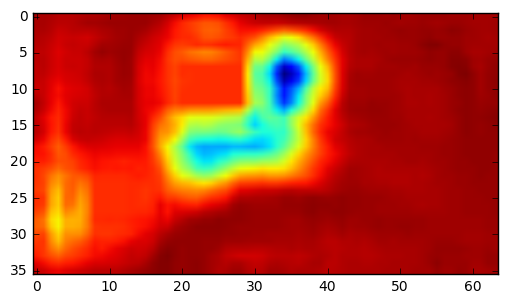

max found at position  (0, 30, 7, 35)
max  102.792
min  -455.14
(3, 31, 9, 10)


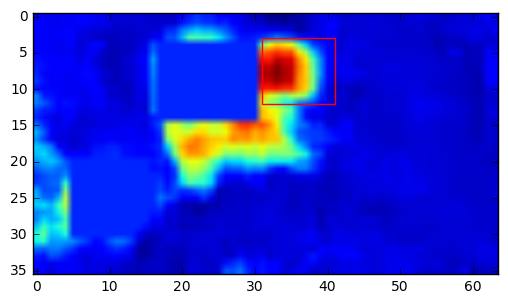

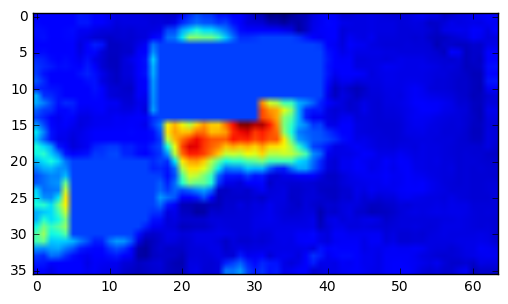

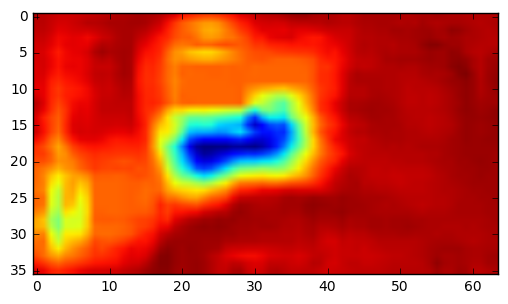

max found at position  (0, 39, 16, 31)
max  74.2543
min  -320.984
(12, 26, 9, 12)


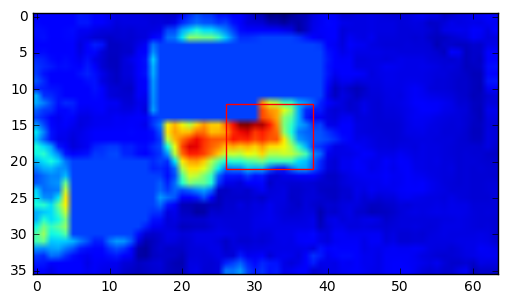

In [36]:
for i in range(4,8):
    print(paths[i])
    plt.imshow(load_img(paths[i]))
    plt.show()
    for j in range(5):
        plt.figure(figsize=(24,24))
        plt.subplot(1,2,1)
        plt.imshow(np.reshape(Y[j][i],mask_size[1]))
        plt.subplot(1,2,2)
        plt.imshow(np.reshape(Z[j][i],mask_size[1]))
        plt.show()
        print("max: ", np.max(Z[j][i]))
        print("min: ", np.min(Z[j][i]))
    masks = np.array([np.reshape(Z[j][i],mask_size[1]) for j in range(5)])
    print(masks.shape)
    rectangles = htr.find_rectangles([masks], threshold=100, ranges=(2,20), clip=0.20, debug=True,
                        border_conf=[(11,3),(71,10)], batch_size=1, max_fish=10)

In [37]:
for X, Y, W , paths in DiskArrayIterator(16, nb_filters, mask_size, FOLDER_TRAIN, test_set, metadata,image_size, with_name=True, shuffle=True):
    break

In [38]:
Z = model.predict(X)

./train/ALB/img_04187.jpg


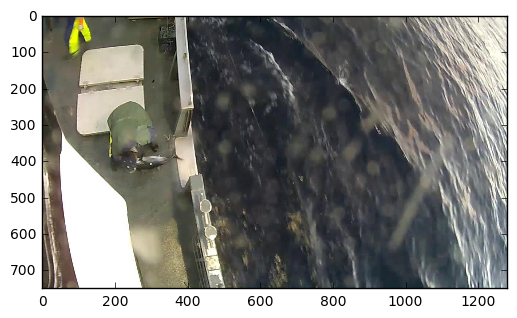

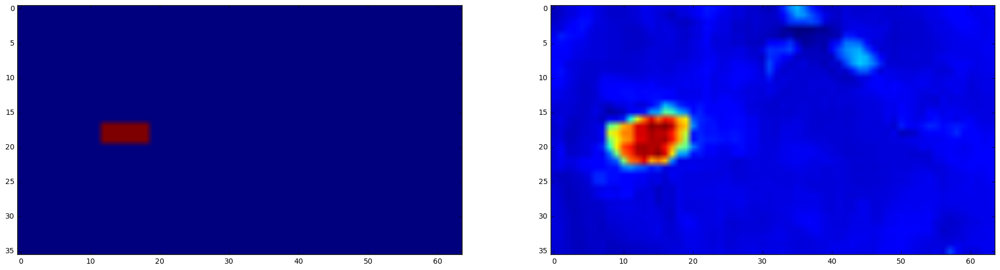

max:  0.708463
min:  -0.0694319


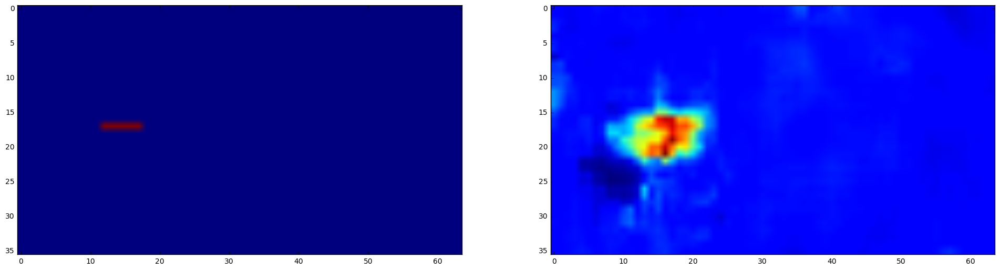

max:  0.34343
min:  -0.0479359


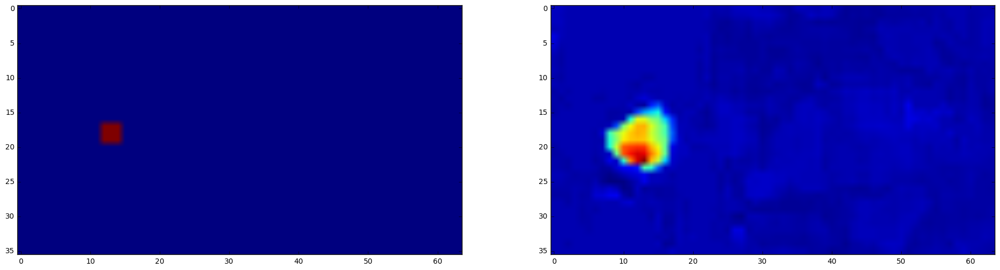

max:  0.450113
min:  -0.0139084


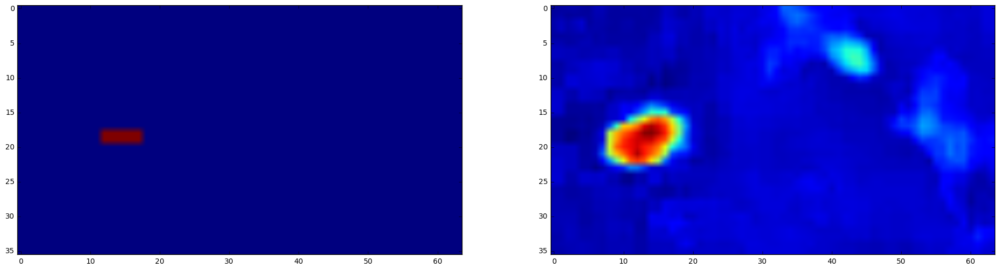

max:  0.683482
min:  -0.0514772


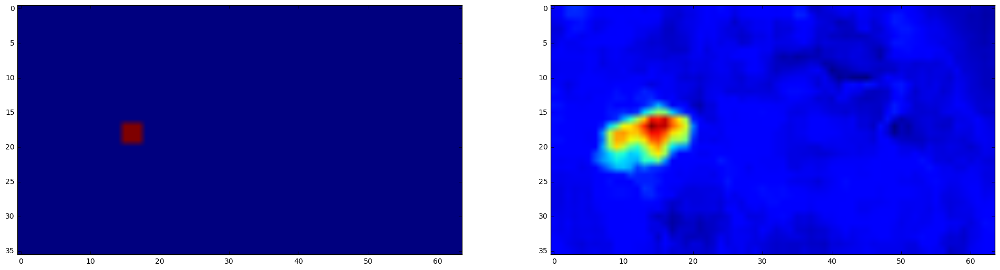

max:  0.532576
min:  -0.0625508
(5, 36, 64)
There are 64 rectangles configurations
The kernel size is 26


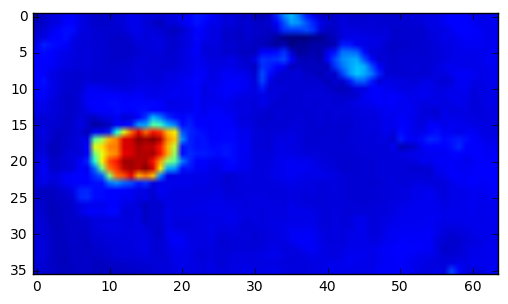

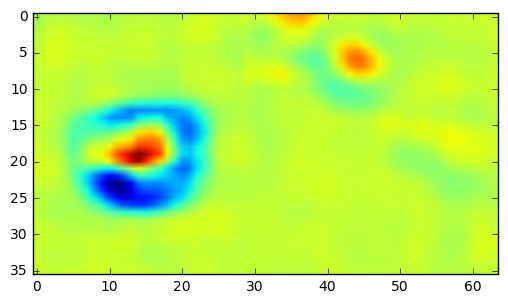

max found at position  (0, 17, 19, 14)
max  106.447
min  -77.3613
(15, 9, 8, 11)


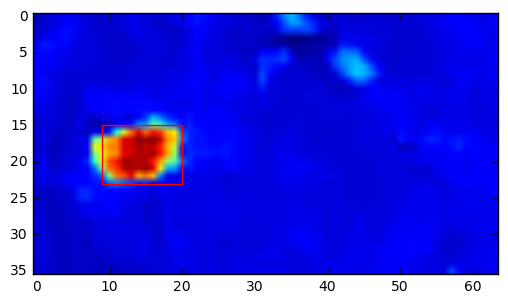

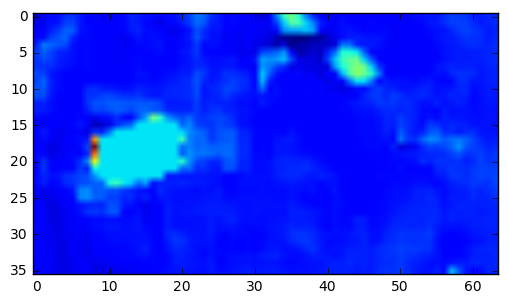

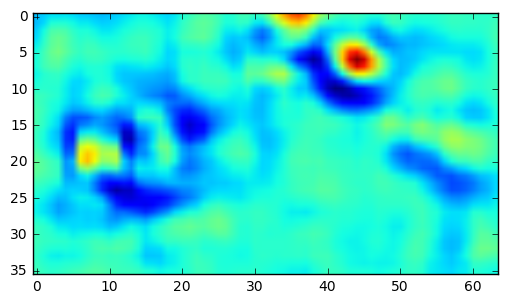

max found at position  (0, 0, 6, 44)
max  28.8529
min  -18.548
(3, 41, 6, 7)


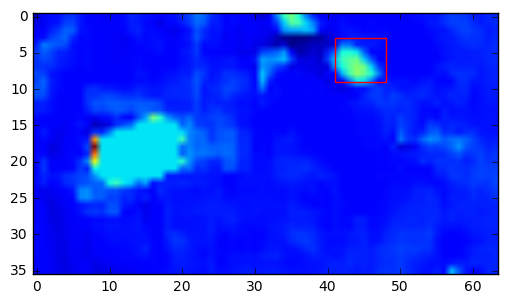

./train/YFT/img_02592.jpg


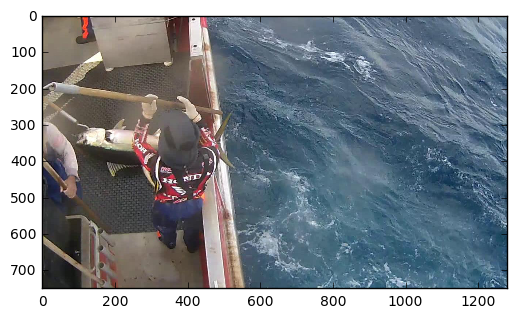

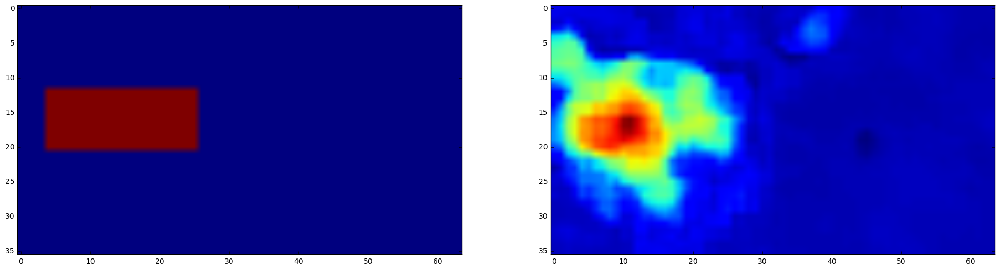

max:  1.16003
min:  -0.0657088


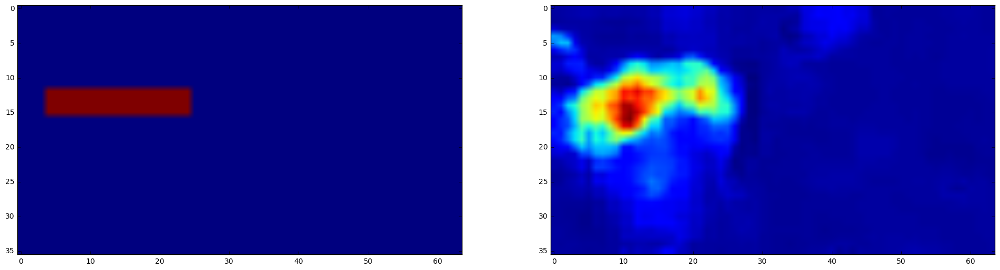

max:  0.987388
min:  -0.0302831


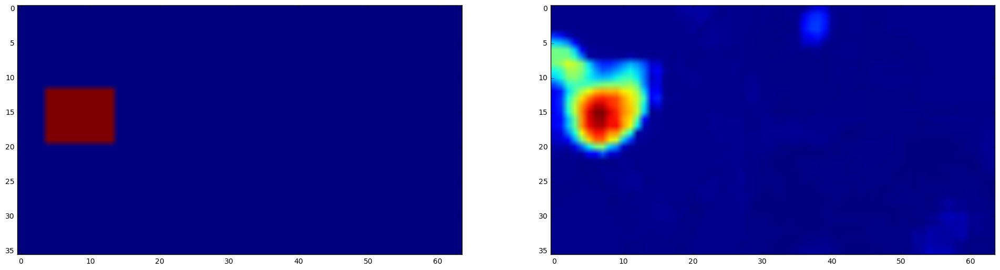

max:  0.849798
min:  -0.00472384


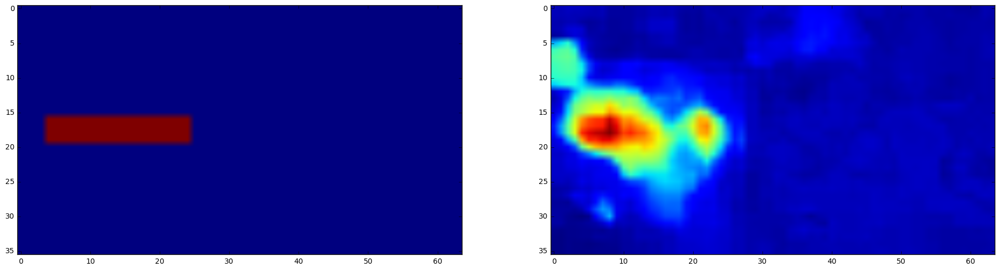

max:  0.940971
min:  -0.0440669


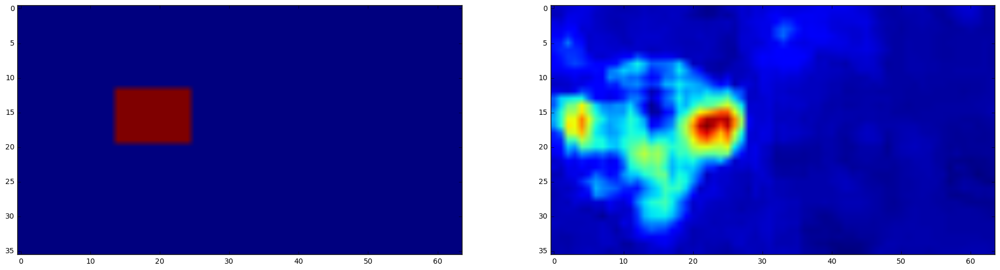

max:  0.671025
min:  -0.0318977
(5, 36, 64)
There are 64 rectangles configurations
The kernel size is 26


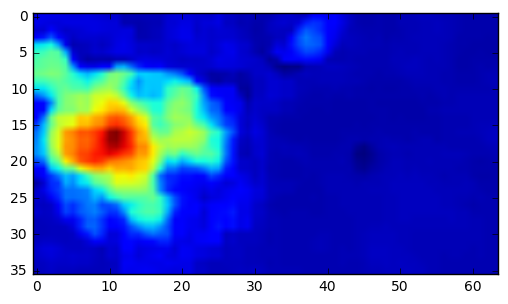

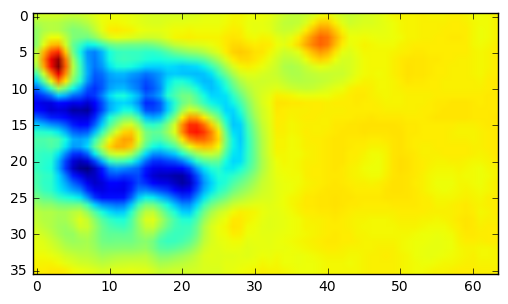

max found at position  (0, 57, 16, 14)
max  248.687
min  -117.431
(12, 4, 8, 21)


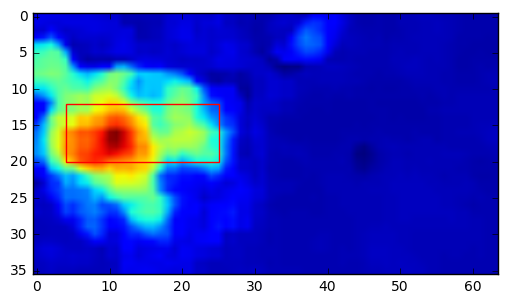

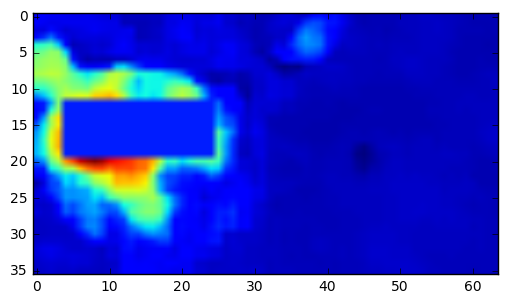

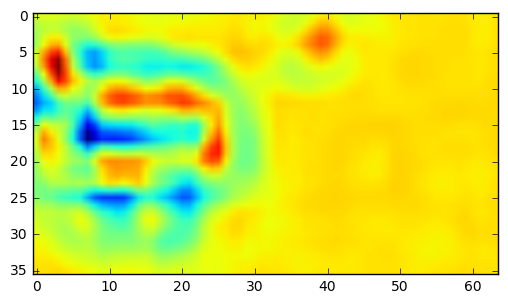

max found at position  (0, 15, 18, 13)
max  103.369
min  -132.142
(8, 9, 20, 9)


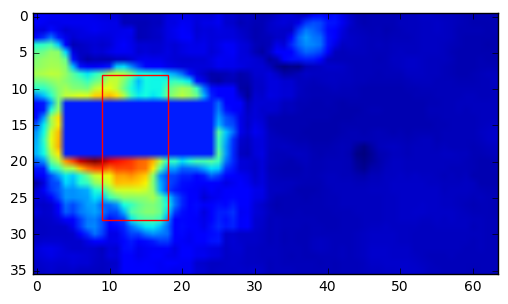

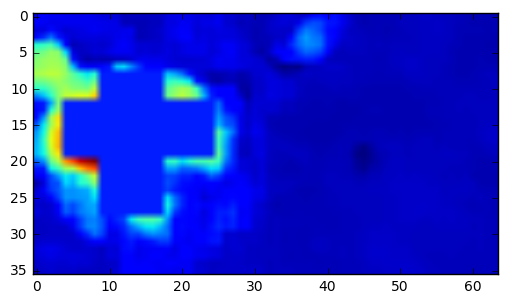

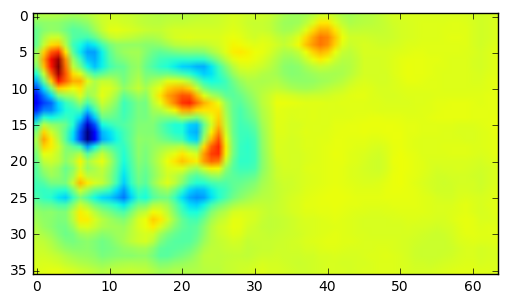

max found at position  (0, 9, 8, 4)
max  78.0322
min  -100.463
(4, 0, 8, 9)


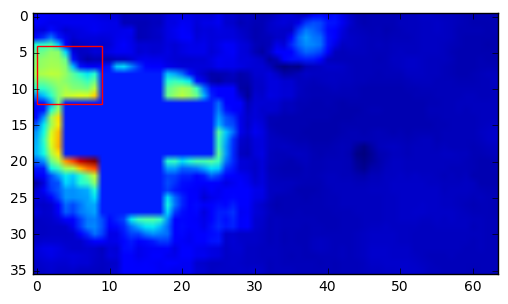

./train/ALB/img_00545.jpg


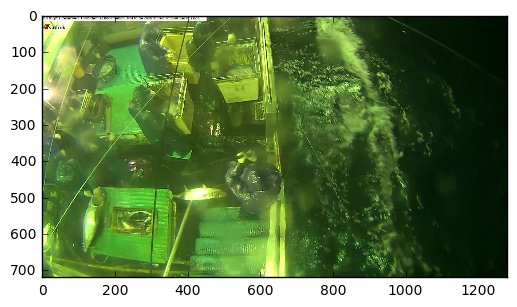

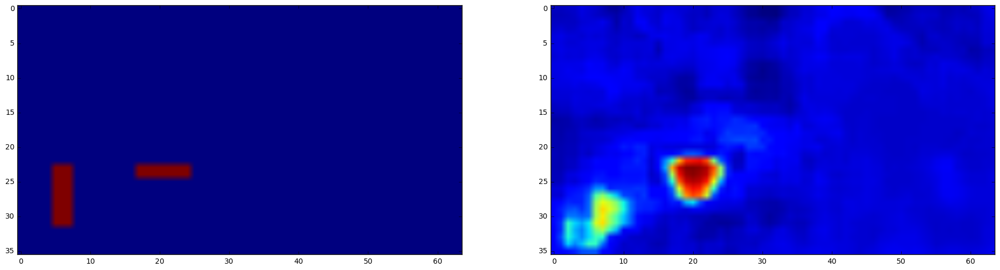

max:  0.846213
min:  -0.0765669


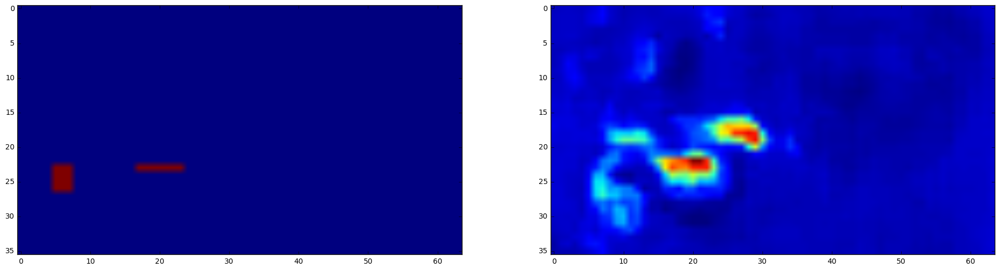

max:  0.563181
min:  -0.0290653


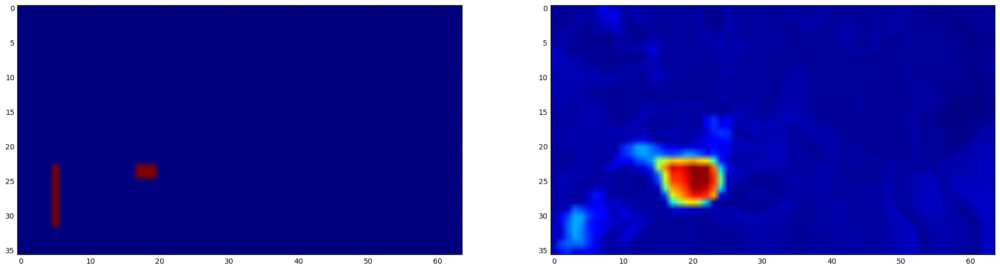

max:  0.543533
min:  -0.0101466


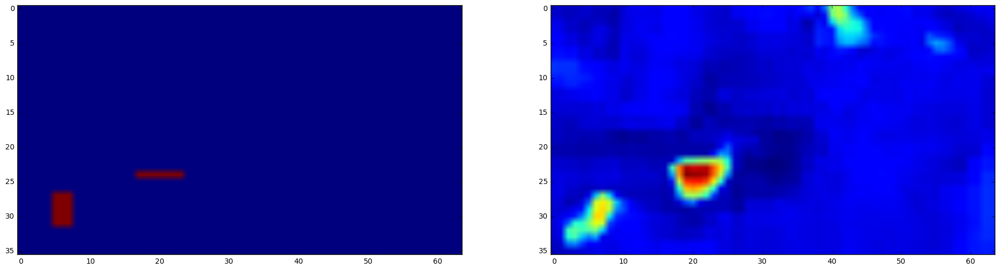

max:  0.659946
min:  -0.0625909


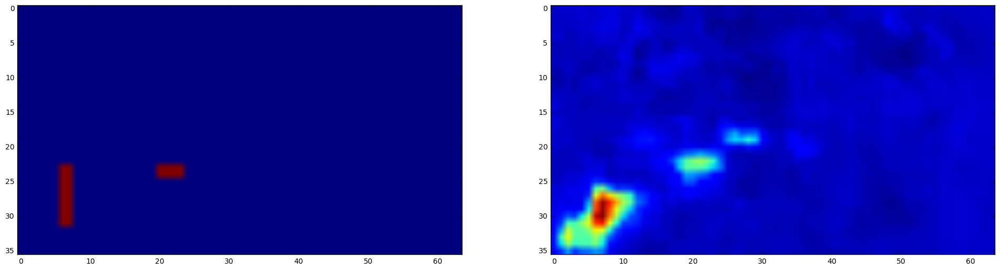

max:  0.571948
min:  -0.0397575
(5, 36, 64)
There are 64 rectangles configurations
The kernel size is 26


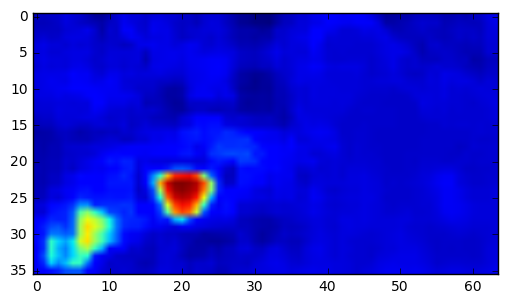

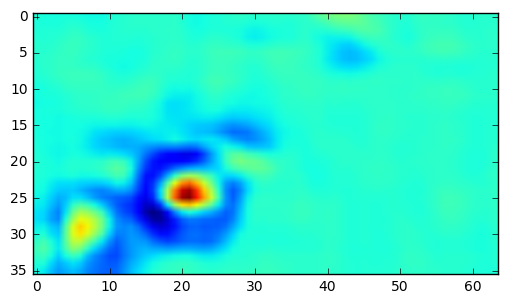

max found at position  (0, 8, 25, 21)
max  119.62
min  -77.8555
(22, 17, 6, 9)


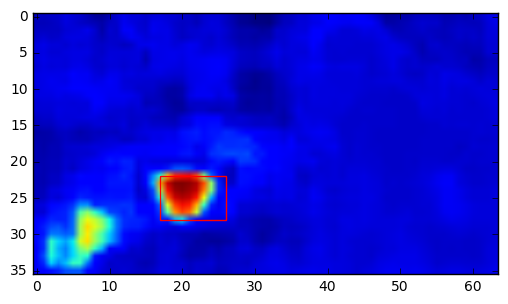

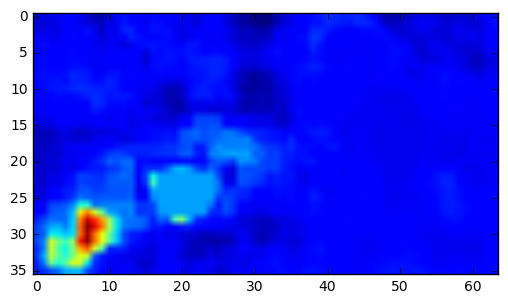

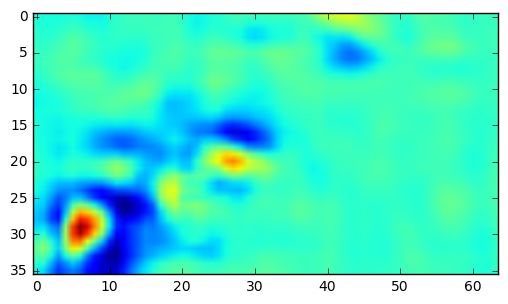

max found at position  (0, 9, 30, 6)
max  68.6376
min  -40.1394
(26, 2, 8, 9)


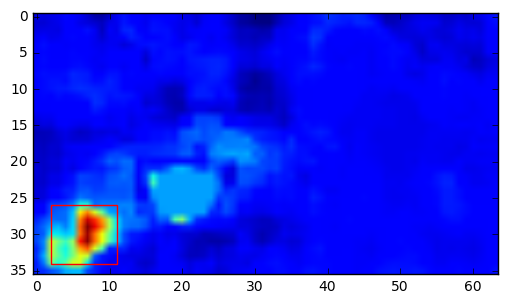

./train/NoF/img_01165.jpg


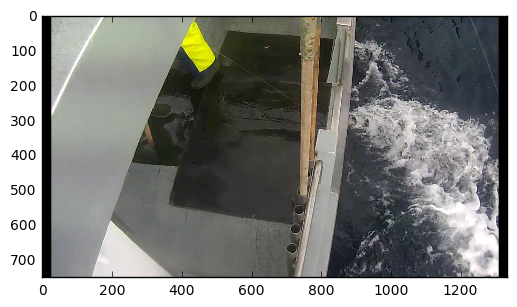

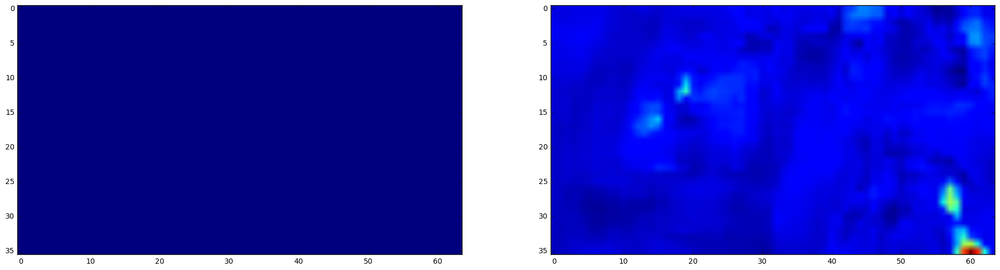

max:  0.334705
min:  -0.0408186


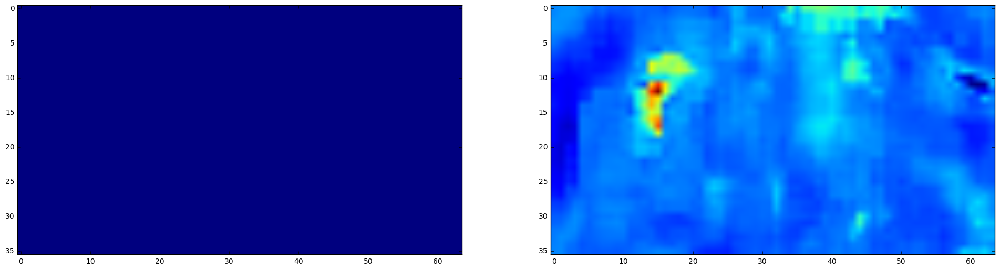

max:  0.141768
min:  -0.0467357


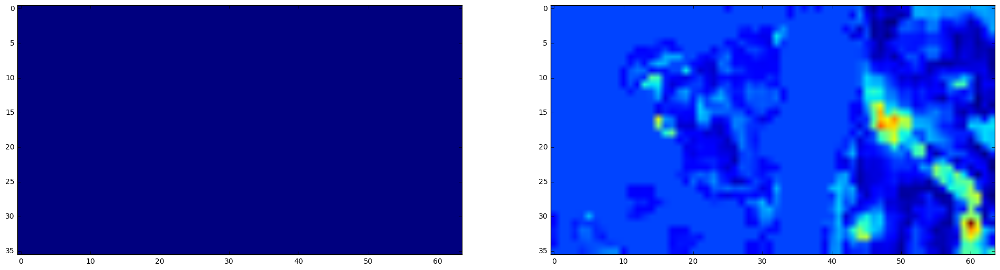

max:  0.0538287
min:  -0.00488921


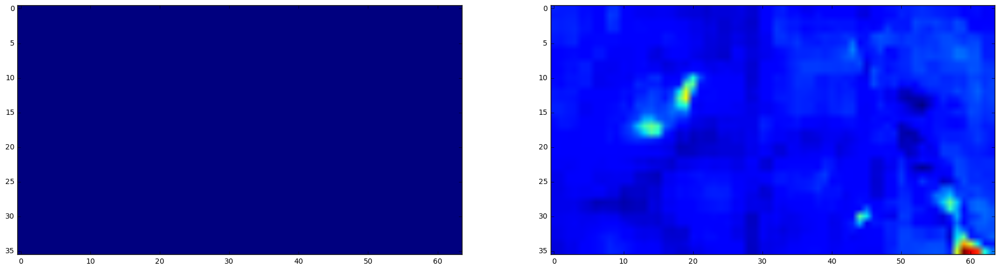

max:  0.322594
min:  -0.0541374


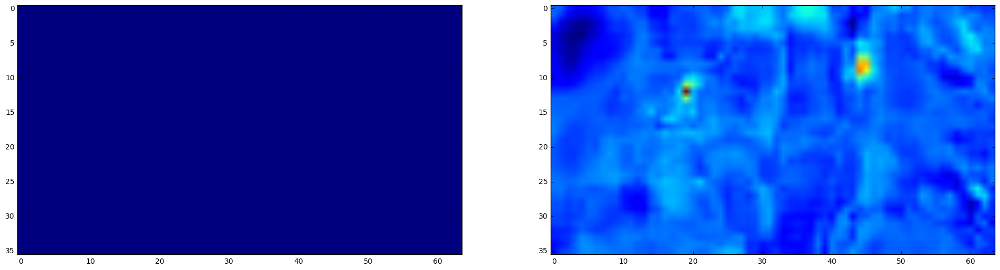

max:  0.142218
min:  -0.0377227
(5, 36, 64)
There are 64 rectangles configurations
The kernel size is 26


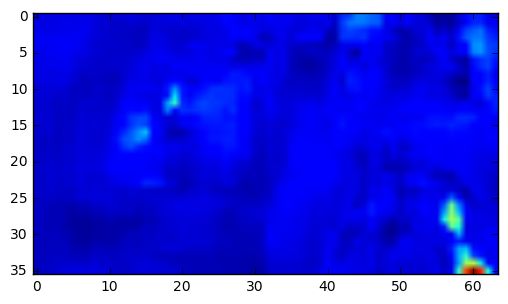

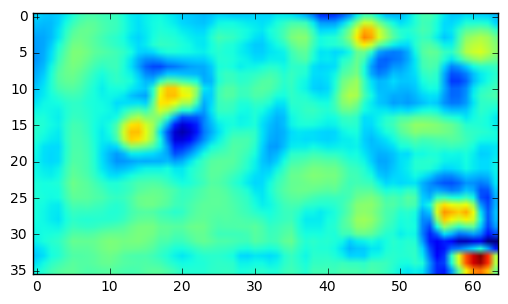

max found at position  (0, 0, 33, 61)
max  18.3792
min  -10.5772
(30, 58, 6, 7)


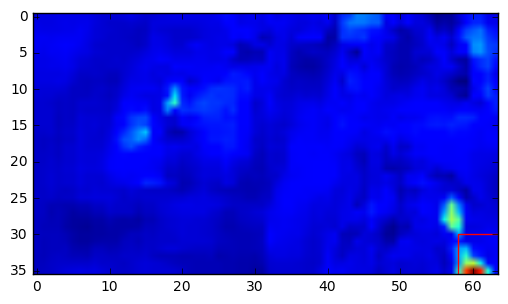

In [39]:
def rescale_masks(masks):
    print(masks.shape)
    for i in range(5):
        masks[i] = masks[i] - masks[i].min()
        masks[i] = masks[i]/masks[i].max()
    return [masks]
    
for i in range(4):
    print(paths[i])
    plt.imshow(load_img(paths[i]))
    plt.show()
    for j in range(5):
        plt.figure(figsize=(24,24))
        plt.subplot(1,2,1)
        plt.imshow(np.reshape(Y[j][i],mask_size[1]))
        plt.subplot(1,2,2)
        plt.imshow(np.reshape(Z[j][i],mask_size[1]))
        plt.show()
        print("max: ", np.max(Z[j][i]))
        print("min: ", np.min(Z[j][i]))
    masks = np.array([np.reshape(Z[j][i],mask_size[1]) for j in range(5)])
    print(masks.shape)
    rectangles = htr.find_rectangles([masks], threshold=100, ranges=(5,20), clip=0.20, debug=True,
                        border_conf=[(11,3),(71,10)], batch_size=1, max_fish=10)

In [ ]:
def img_mask_generator(batch_size=32, image_size = (224,224),mask_size=(100,100), lambda_ratio=10):
    reshaped = mask_size[0]*mask_size[1]
    
    X = np.zeros((batch_size, 3)+image_size)
    #X = np.ones((batch_size, 1)+mask_size)
    #Y = np.zeros((batch_size, mask_size[0]*mask_size[1], 2))
    Y = np.zeros((batch_size, reshaped,1))
    W = np.zeros((batch_size, reshaped))
    while True:
        c=0
        for key, v in metadata.items():
            
            # First of all, if there is no rectangle and the image is not in NoF, 
            # then there is a problem.
            
            if v["class"] != "NoF" and "rectangles" not in v:
                continue
            mask0 = np.expand_dims(h_gen.get_mask(v, mask_size), axis=0)
            mask0 = np.reshape(mask0,(reshaped,))
            
            y = np.expand_dims(mask0, axis=1)

            X[c] = img_to_array(load_img(v["path"],target_size=image_size))
            Y[c] = y
            W[c] = mask0*(lambda_ratio-1) + np.ones(mask0.shape)
            c+=1
            
            if c == batch_size:
                c = 0 
                yield X, Y, W
            

In [ ]:
batch_size = 2
image_size = (720,1280)
lambda_ratio = 20

for X, Y, W in img_mask_generator(batch_size, image_size,(100,100), lambda_ratio):
    break

In [ ]:
batch_size = 2

lambda_ratio = 20

In [ ]:
model1 = ResNet50(include_top=False)
for layer in model1.layers:
    layer.trainable=False

In [ ]:
model1 = heatmap.to_heatmap(model1)

In [ ]:
for layer in model1.layers:
    layer.trainable=False

In [ ]:
model1.layers[-2]

In [ ]:
a,b,c = heatmap.get_dim(model1,-2, input_shape=(3,) + image_size)

In [ ]:
b,c

In [ ]:
a

In [ ]:
mask_size = (23, 40)

In [ ]:
mask_size = (b,c)

In [ ]:
img_a = Input(shape=(3,) + image_size)
model2 = Model(model1.input, model1.layers[-2].output)
x = model2(img_a)
x = AveragePooling2D(pool_size=(7, 7), strides=(1,1), border_mode="same")(x)
x = Convolution2D(1024, 1, 1, activation='relu')(x)
x = Convolution2D(512, 1, 1, activation='relu')(x)
x = Convolution2D(256, 1, 1, activation='relu')(x)
x = Convolution2D(128, 1, 1, activation='relu')(x)
x = Convolution2D(32, 1, 1, activation='relu')(x)
x = Convolution2D(16, 1, 1, activation='relu')(x)
x = Convolution2D(1, 1, 1, activation='linear')(x)
#x = LeakyReLU(alpha=0.3)(x)
x = Reshape((1, b*c))(x)
x = Permute((2, 1))(x)
model = Model(img_a,x)

In [ ]:
model2.summary()

In [ ]:
model.summary()

In [ ]:
sgd = SGD(lr=0.000001, decay=1e-6, momentum=0.0, nesterov=True)
model.compile(loss='mse', optimizer=sgd, sample_weight_mode="temporal")

In [ ]:
history = model.fit_generator(img_mask_generator(batch_size, image_size,mask_size, lambda_ratio), 
                    samples_per_epoch=8, nb_epoch=500, callbacks=[remote], verbose=0)

In [ ]:
for X, Y, W in img_mask_generator(batch_size, image_size,mask_size, lambda_ratio):
    Z = model.predict(X)
    break

In [ ]:
plt.imshow(array_to_img(X[0]))
plt.show()
plt.imshow(np.swapaxes(np.reshape(Y[0],(c,b)),0,1))
plt.show()
plt.imshow(np.swapaxes(np.reshape(Z[0],(c,b)),0,1) - np.min(Z[0]))
plt.show()
a = Z[0]
idx = Z[0][:,:] > 1
a[idx] = 1
idx = Z[0][:,:] < 0
a[idx] = 0 
plt.imshow(np.swapaxes(np.reshape(a,(c,b)),0,1))
plt.show()


In [ ]:
np.max(Z[0])

In [ ]:
np.min(Z[0])

In [ ]:
img_a = Input(shape=(3,) + image_size)
model2 = Model(model1.input, model1.layers[-2].output)
x = model2(img_a)
x = AveragePooling2D(pool_size=(7, 7), strides=(1,1), border_mode="same")(x)
model = Model(img_a,x)

In [ ]:
X = np.zeros((1, 3)+image_size)
for key, v in metadata.items():
    
    # First of all, if there is no rectangle and the image is not in NoF, 
    # then there is a problem.

    if v["class"] != "NoF" and "rectangles" not in v:
        continue

    #X[0] = img_to_array(load_img(v["path"],target_size=image_size))
    #y = model.predict(X)[0]
    y = utils.load("out_resnet/" + v["filename"])
    utils.save_array(y, "out_resnet/bco/" + v["filename"])

In [ ]:
def img_mask_generator(batch_size=32, image_size = (224,224),mask_size=(100,100), lambda_ratio=10, buffer_size=100):
    reshaped = mask_size[0]*mask_size[1]
    buffer = np.zeros((buffer_size, 2048) + mask_size)
    buffer_names = {}
    X = np.zeros((batch_size, 2048) + mask_size)
    Y = np.zeros((batch_size, 2048) + mask_size)
    #X = np.ones((batch_size, 1)+mask_size)
    #Y = np.zeros((batch_size, mask_size[0]*mask_size[1], 2))
    #Y = np.zeros((batch_size, reshaped,1))
    W = np.zeros((batch_size, reshaped))
    buffer_count = 0
    while True:
        c=0
        t = time.time()
        for key, v in metadata.items():
            
            # First of all, if there is no rectangle and the image is not in NoF, 
            # then there is a problem.
            
            if v["class"] != "NoF" and "rectangles" not in v:
                continue
            """mask0 = np.expand_dims(h_gen.get_mask(v, mask_size[::-1]), axis=0)
            mask0 = np.reshape(mask0,(reshaped,))
            #print(v["class"], v["filename"])
            y = np.expand_dims(mask0, axis=1)"""
            try:
                idx = buffer_names[v["filename"]]
                x = buffer[idx]
            except KeyError:
                x = utils.load_array("out_resnet/bco/" + v["filename"])
            
            if buffer_count < buffer_size:
                buffer[buffer_count] = x
                buffer_names[v["filename"]] = buffer_count
                buffer_count+=1
            
            X[c] = x
            Y[c] = x
            #W[c] = mask0*(lambda_ratio-1) + np.ones(mask0.shape)
            c+=1
            
            if c == batch_size:
                c = 0 
                yield X, Y
                #yield X, Y, W
        print(time.time() - t)

In [ ]:
img_a = Input(shape=(2048,) + mask_size)
x = Convolution2D(1024, 1, 1, activation='relu')(img_a)
x = Convolution2D(512, 1, 1, activation='relu')(x)
x = Convolution2D(1024, 1, 1, activation='relu')(x)
x = Convolution2D(2048, 1, 1, activation='linear')(x)
model = Model(img_a,x)

In [ ]:
sgd = SGD(lr=15, decay=0.001, momentum=0.0, nesterov=True)
model.compile(loss='mse', optimizer=sgd, sample_weight_mode="temporal")

In [ ]:
history = model.fit_generator(img_mask_generator(32, image_size,mask_size, lambda_ratio), 
                    samples_per_epoch=128, nb_epoch=5000, callbacks=[remote], verbose=0)

In [ ]:
def img_mask_generator(batch_size=32, image_size = (224,224),mask_size=(100,100), lambda_ratio=10, buffer_size=100):
    reshaped = mask_size[0]*mask_size[1]
    buffer = np.zeros((buffer_size, 2048) + mask_size)
    buffer_names = {}
    X = np.zeros((batch_size, 2048) + mask_size)
    #X = np.ones((batch_size, 1)+mask_size)
    #Y = np.zeros((batch_size, mask_size[0]*mask_size[1], 2))
    Y = np.zeros((batch_size, reshaped,1))
    W = np.zeros((batch_size, reshaped))
    buffer_count = 0
    while True:
        c=0
        t = time.time()
        for key, v in metadata.items():
            
            # First of all, if there is no rectangle and the image is not in NoF, 
            # then there is a problem.
            
            if v["class"] != "NoF" and "rectangles" not in v:
                continue
            """mask0 = np.expand_dims(h_gen.get_mask(v, mask_size[::-1]), axis=0)
            mask0 = np.reshape(mask0,(reshaped,))
            #print(v["class"], v["filename"])
            y = np.expand_dims(mask0, axis=1)"""
            try:
                idx = buffer_names[v["filename"]]
                x = buffer[idx]
            except KeyError:
                x = utils.load_array("out_resnet/bco/" + v["filename"])
            
            if buffer_count < buffer_size:
                buffer[buffer_count] = x
                buffer_names[v["filename"]] = buffer_count
                #buffer_count+=1
            
            X[c] = x
            #Y[c] = y
            #W[c] = mask0*(lambda_ratio-1) + np.ones(mask0.shape)
            c+=1
            
            if c == batch_size:
                c = 0 
                yield X, Y, W
        print(time.time() - t)

In [ ]:
for X, Y, W in img_mask_generator(8, image_size,mask_size, lambda_ratio):
    Z = model.predict(X)
    break

In [ ]:
mask_size = (23,40)

In [ ]:
for i in range(0,8):
    plt.imshow(np.reshape(Y[i],(b,c)))
    plt.show()
    print("max: " + str(np.max(Z[i])))
    print("min: " + str(np.min(Z[i])))
    print("loss= " + str(np.sum(np.square(Y[i]-Z[i])*Y[i]*(lambda_ratio-1) + np.ones(Y[i].shape))/(23*40)))
    plt.imshow(np.reshape(Z[i],(b,c)))
    plt.show()

In [ ]:
np.min(Z)

In [ ]:
mask_size = (23,40)

In [ ]:
b,c = 23,40

In [ ]:
img_a = Input(shape=(2048,) + mask_size)
x = Convolution2D(1024, 1, 1, activation='relu')(img_a)
x = Convolution2D(512, 1, 1, activation='relu')(x)
x = Convolution2D(256, 1, 1, activation='relu')(x)
x = Convolution2D(128, 1, 1, activation='relu')(x)
x = Convolution2D(32, 1, 1, activation='relu')(x)
x = Convolution2D(16, 1, 1, activation='relu')(x)
x = Convolution2D(1, 1, 1, activation='linear')(x)
#x = LeakyReLU(alpha=0.3)(x)
x = Reshape((1, b*c))(x)
x = Permute((2, 1))(x)
model = Model(img_a,x)

In [ ]:
sgd = SGD(lr=0.001, decay=0.001, momentum=0.0, nesterov=True)
model.compile(loss='mse', optimizer=sgd, sample_weight_mode="temporal")

In [ ]:
history = model.fit_generator(img_mask_generator(64, image_size,mask_size, lambda_ratio), 
                    samples_per_epoch=128, nb_epoch=5000, callbacks=[remote], verbose=0)

In [ ]:
np.sum(Z[0])

In [ ]:
np.all(np.equal(Y[0], Z[0]))

In [ ]:
np.sum(Z[0])

In [ ]:
img_input = Input(shape=(1,100,100))
x = Convolution2D(1, 1, 1, border_mode="same")(img_input)
#x = Permute((1,2))(x)
#x = Permute((1,3))(x)
x = Reshape((1, 100*100))(x)
x = Permute((2, 1))(x)
#x = heatmap.Softmax4D(axis=1,name="softmax")(x)
model = Model(img_input,x)

In [ ]:
model.layers[1].trainable = True

In [ ]:
a = model.layers[1].get_weights()

In [ ]:
a[1][0] = 0

In [ ]:
a[0][0,0,0,0] = 1

In [ ]:
model.layers[1].set_weights(a)

In [ ]:
model.layers[1].get_weights()

In [ ]:
model.layers[1].get_config()

In [ ]:
model.summary()

In [ ]:
sgd = SGD(lr=0.1, decay=1e-6, momentum=0.0, nesterov=True)
model.compile(loss='mse', optimizer=sgd, sample_weight_mode="temporal")

In [ ]:
model.fit_generator(img_mask_generator(batch_size=3000), samples_per_epoch=32, nb_epoch=20, callbacks=[remote], verbose=0)

In [ ]:
Z = model.predict(X)

In [ ]:
np.max(Z[0])